<a href="https://colab.research.google.com/github/furibeguerra/Vision_por_computadora_II/blob/main/EDA_Trashnet_Uribe_Caihuara_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visión por Computadora II - Trabajo Final
##Fabian Andres Uribe Guerra
##Fabian Caihuara Sossa


# Kaggle - Origen de datos

In [1]:
!pip install kaggle opendatasets

In [ ]:
from google.colab import files
files.upload() # Selecciona el archivo kaggle.json

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d feyzazkefe/trashnet

Dataset URL: https://www.kaggle.com/datasets/feyzazkefe/trashnet
License(s): unknown
  0% 0.00/40.8M [00:00<?, ?B/s]
100% 40.8M/40.8M [00:00<00:00, 803MB/s]


In [ ]:
!unzip trashnet.zip -d trashnet_images

Archive:  trashnet.zip
  inflating: trashnet_images/dataset-resized/cardboard/cardboard1.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard10.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard100.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard101.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard102.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard103.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard104.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard105.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard106.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard107.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard108.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard109.jpg  
  inflating: trashnet_images/dataset-resized/cardboard/cardboard11.jpg  
  inflating: trashn

# 1. EDA

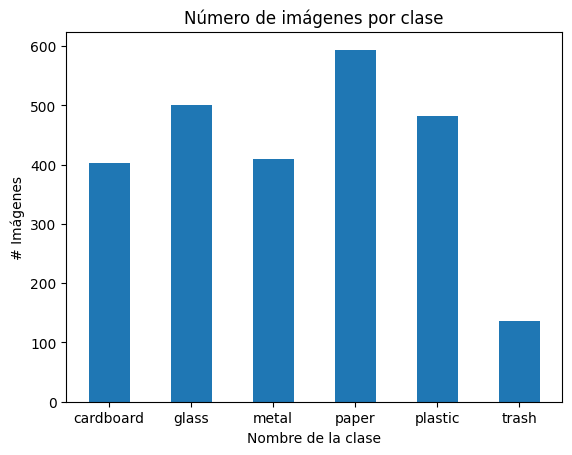

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


base_dir = '/content/trashnet_images/dataset-resized'
class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']
clases = {'cardboard': len(os.listdir(base_dir + '/cardboard')),
          'glass': len(os.listdir(base_dir + '/glass')),
          'metal': len(os.listdir(base_dir + '/metal')),
          'paper': len(os.listdir(base_dir + '/paper')),
          'plastic': len(os.listdir(base_dir + '/plastic')),
          'trash': len(os.listdir(base_dir + '/trash'))
          }

plt.bar(clases.keys(), clases.values(), width = .5);
plt.title("Número de imágenes por clase");
plt.xlabel('Nombre de la clase');
plt.ylabel('# Imágenes');

[########################################] | 100% Completed | 4.59 s
[########################################] | 100% Completed | 1.96 s
[########################################] | 100% Completed | 1.77 s
[########################################] | 100% Completed | 2.17 s
[########################################] | 100% Completed | 2.05 s
[########################################] | 100% Completed | 2.15 s


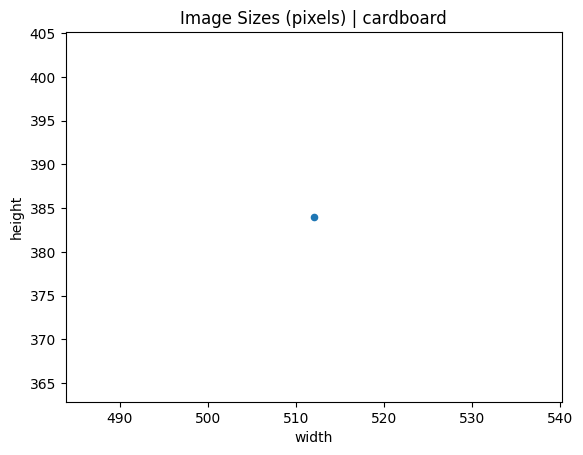

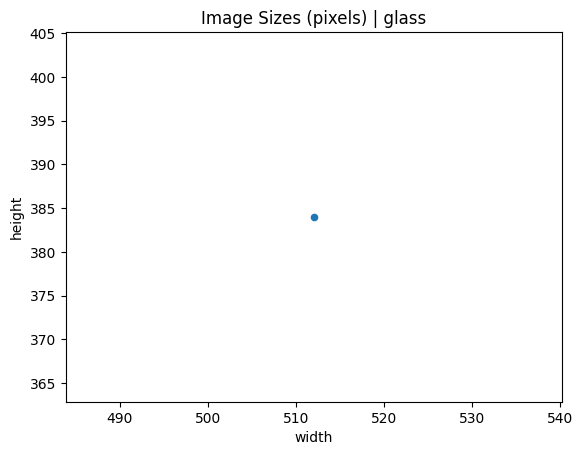

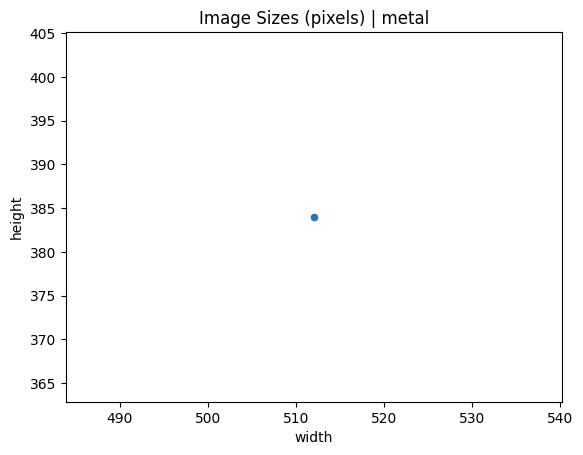

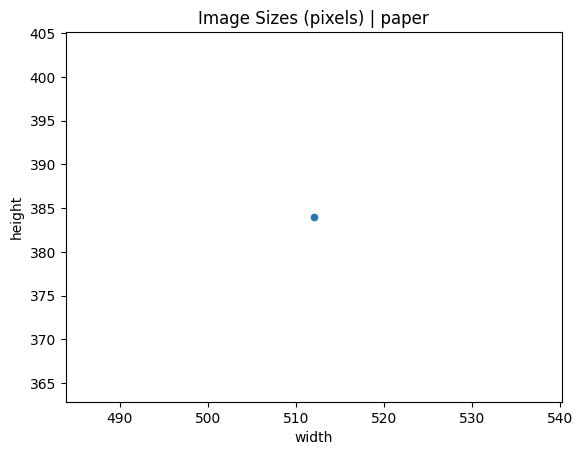

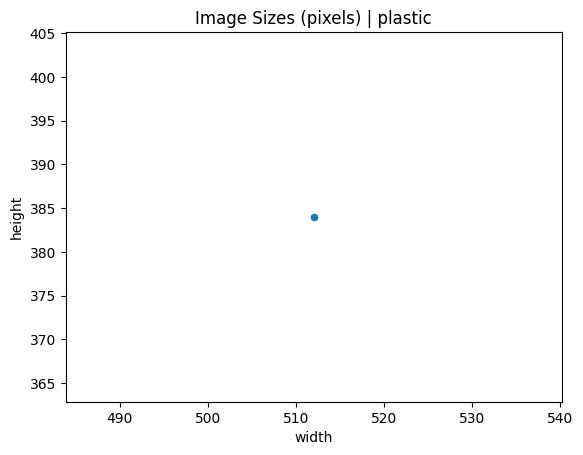

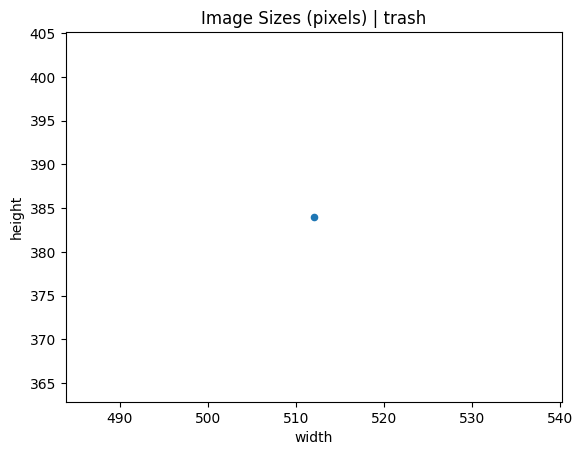

In [ ]:
from dask import bag
from dask import diagnostics
from PIL import Image

rutas = {'cardboard': base_dir + '/cardboard/',
          'glass': base_dir + '/glass/',
          'metal': base_dir + '/metal/',
          'paper': base_dir + '/paper/',
          'plastic': base_dir + '/plastic/',
          'trash': base_dir + '/trash/'
          }

def get_dims(file):
  '''Returns dimenstions for an RBG image'''
  im = Image.open(file)
  arr = np.array(im)
  h,w,d = arr.shape
  return h,w

for n,d in rutas.items():
  filepath = d
  filelist = [filepath + f for f in os.listdir(filepath)]
  dims = bag.from_sequence(filelist).map(get_dims)
  with diagnostics.ProgressBar():
    dims = dims.compute()
    dim_df = pd.DataFrame(dims, columns=['height', 'width'])
    sizes = dim_df.groupby(['height', 'width']).size().reset_index().rename(columns={0:'count'})
    sizes.plot.scatter(x='width', y='height');
    plt.title('Image Sizes (pixels) | {}'.format(n))

Clase: CARDBOARD


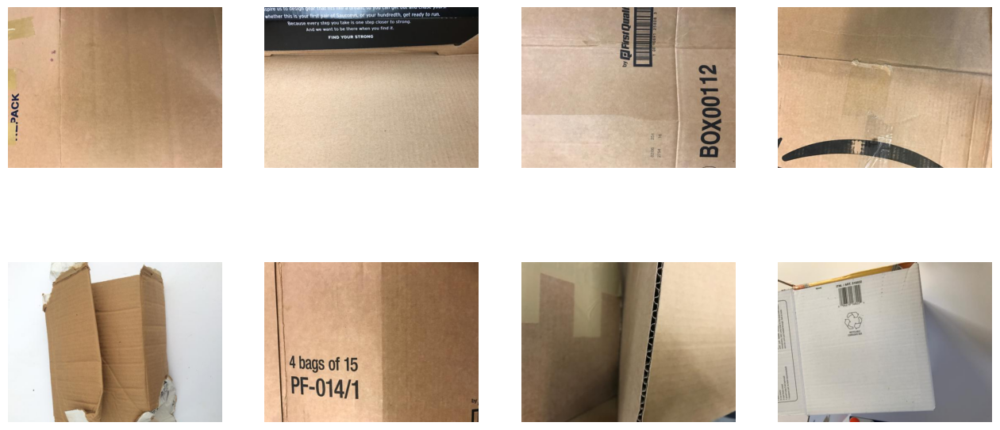

Clase: GLASS


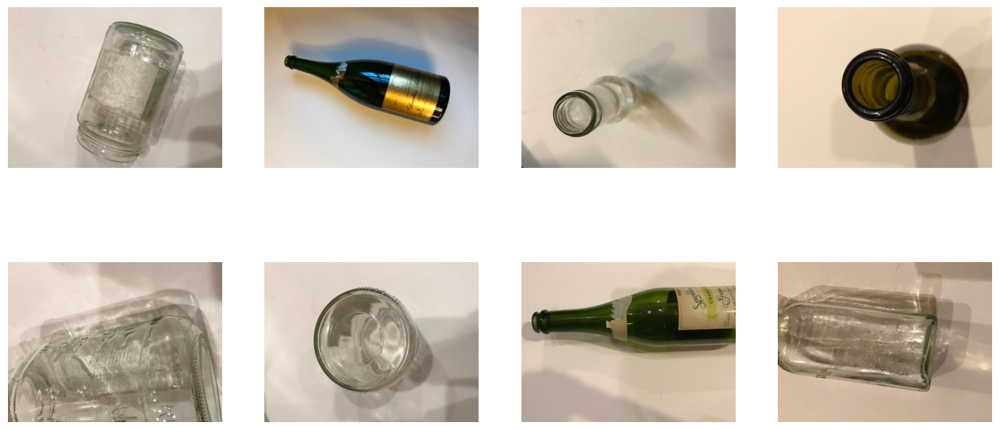

Clase: METAL


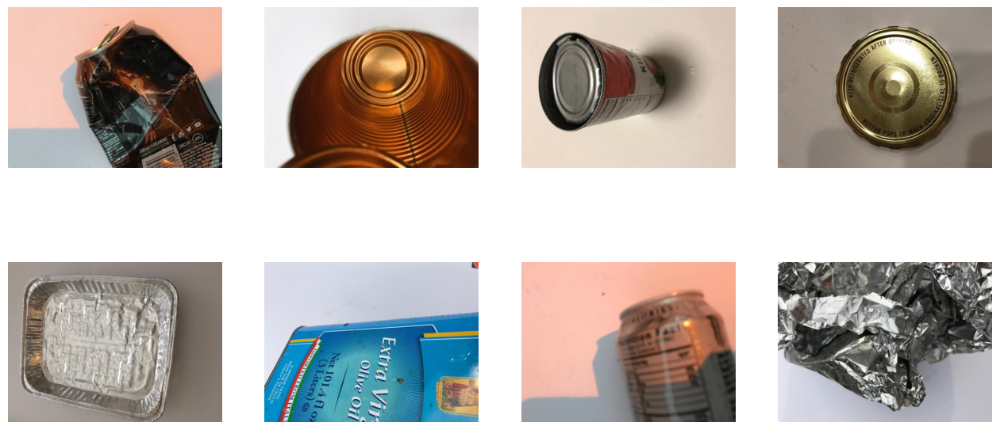

Clase: PAPER


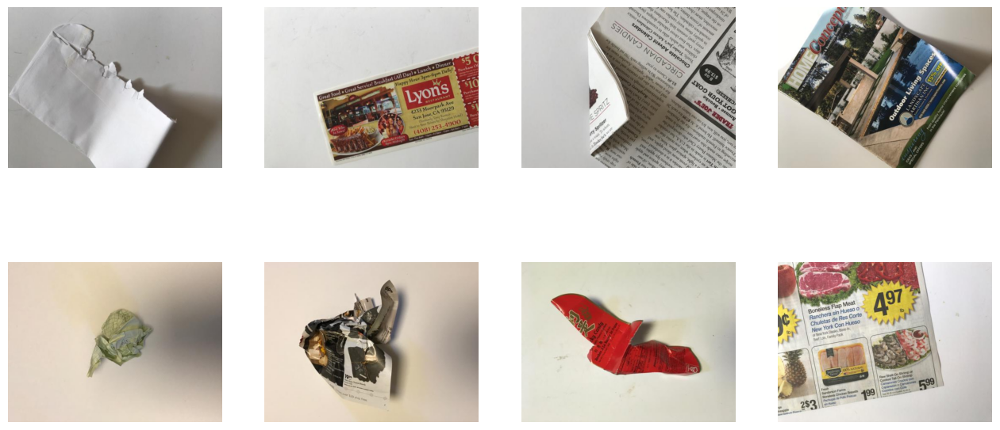

Clase: PLASTIC


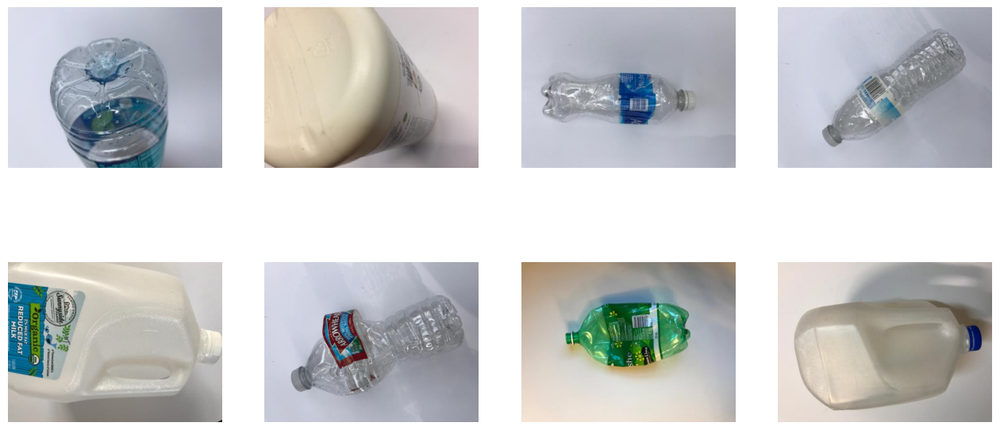

Clase: TRASH


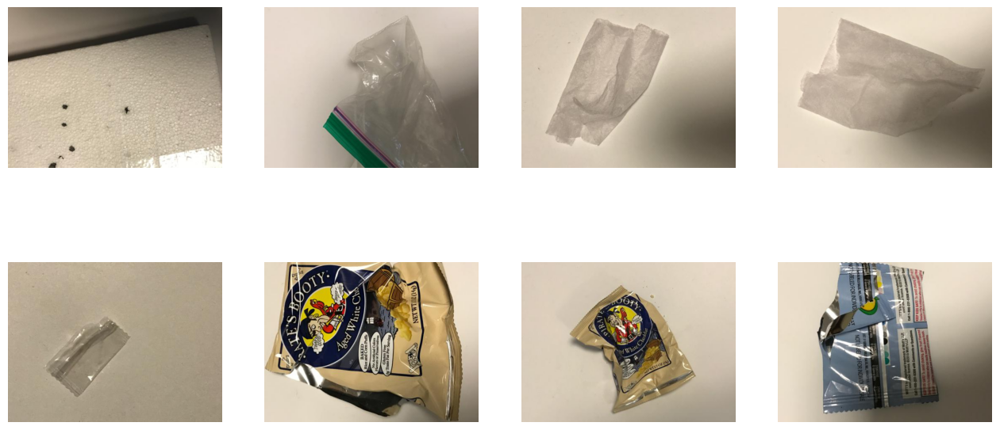

In [ ]:
# Show images displayed 4x4
nrows = 4
ncols = 4
# Index for iterating over images
pic_index = 0
pic_index += 8

# Import mpimg
import matplotlib.image as mpimg
import os # Ensure os is imported

# Get the list of filenames for the 'cardboard' class
cardboard_filenames = os.listdir(base_dir + '/cardboard')
glass_filenames = os.listdir(base_dir + '/glass')
metal_filenames = os.listdir(base_dir + '/metal')
paper_filenames = os.listdir(base_dir + '/paper')
plastic_filenames = os.listdir(base_dir + '/plastic')
trash_filenames = os.listdir(base_dir + '/trash')
# Select a slice of filenames
#next_blight_pix = [os.path.join(base_dir + '/cardboard', fname)
             #     for fname in cardboard_filenames[pic_index-8:pic_index]]

def show_image_sample(pic_directory):
  fig = plt.gcf()
  fig.set_size_inches(ncols * 4, nrows * 4)
  for i, img_path in enumerate(pic_directory):
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off')
    try:
        img = mpimg.imread(img_path)
        plt.imshow(img)
    except Exception as e:
        print(f"Error loading image {img_path}: {e}")
        sp.text(0.5, 0.5, 'Error', ha='center', va='center', color='red') # Indicate error on subplot
  plt.show() # Show the plot after the loop

# Example usage (assuming you want to show samples from the 'cardboard' class)
print('Clase: CARDBOARD')
show_image_sample([os.path.join(base_dir + '/cardboard', fname)
                   for fname in cardboard_filenames[pic_index-8:pic_index]])
print('Clase: GLASS')
show_image_sample([os.path.join(base_dir + '/glass', fname)
                   for fname in glass_filenames[pic_index-8:pic_index]])
print('Clase: METAL')
show_image_sample([os.path.join(base_dir + '/metal', fname)
                   for fname in metal_filenames[pic_index-8:pic_index]])
print('Clase: PAPER')
show_image_sample([os.path.join(base_dir + '/paper', fname)
                   for fname in paper_filenames[pic_index-8:pic_index]])
print('Clase: PLASTIC')
show_image_sample([os.path.join(base_dir + '/plastic', fname)
                   for fname in plastic_filenames[pic_index-8:pic_index]])
print('Clase: TRASH')
show_image_sample([os.path.join(base_dir + '/trash', fname)
                   for fname in trash_filenames[pic_index-8:pic_index]])


In [ ]:
# Bloque 1: Importaciones y Configuración Inicial
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd # Opcional, para manejar rutas y etiquetas si lo prefieres

# Define tus parámetros
IMAGE_WIDTH = 224 # Puedes ajustar esto
IMAGE_HEIGHT = 224
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS = 3 # RGB
BATCH_SIZE = 32 # Puedes ajustar esto
EPOCHS = 50 # Puedes ajustar esto

# Ruta al directorio principal de tu dataset (donde están las subcarpetas glass, paper, plastic)

base_dir = '/content/trashnet_images/dataset-resized'

# Directorios de las clases que usaremos
class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']
num_classes = len(class_names)

print(f"Tamaño de imagen de entrada: {IMAGE_SIZE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Número de clases: {num_classes}")
print(f"Clases: {class_names}")
print(f"Directorio base: {base_dir}")

# Verificar si el directorio base existe
if not os.path.exists(base_dir):
    print(f"ERROR: El directorio base '{base_dir}' no existe. Por favor, verifica la ruta.")
else:
    print(f"Directorio base encontrado: '{base_dir}'")
    # Verificar subdirectorios de clases
    for cls_name in class_names:
        cls_path = os.path.join(base_dir, cls_name)
        if not os.path.exists(cls_path):
            print(f"ADVERTENCIA: El subdirectorio para la clase '{cls_name}' ({cls_path}) no existe.")
        else:
            num_files = len(os.listdir(cls_path))
            print(f"Clase '{cls_name}' encontrada en '{cls_path}' con {num_files} imágenes.")

Tamaño de imagen de entrada: (224, 224)
Batch size: 32
Número de clases: 6
Clases: ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']
Directorio base: /content/trashnet_images/dataset-resized
Directorio base encontrado: '/content/trashnet_images/dataset-resized'
Clase 'cardboard' encontrada en '/content/trashnet_images/dataset-resized/cardboard' con 403 imágenes.
Clase 'glass' encontrada en '/content/trashnet_images/dataset-resized/glass' con 501 imágenes.
Clase 'metal' encontrada en '/content/trashnet_images/dataset-resized/metal' con 410 imágenes.
Clase 'paper' encontrada en '/content/trashnet_images/dataset-resized/paper' con 594 imágenes.
Clase 'plastic' encontrada en '/content/trashnet_images/dataset-resized/plastic' con 482 imágenes.
Clase 'trash' encontrada en '/content/trashnet_images/dataset-resized/trash' con 137 imágenes.


In [ ]:
#EDA Parte I

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 # OpenCV
from PIL import Image # Pillow
from skimage.metrics import structural_similarity as ssim # Para comparar similitud, opcional
import os
from tqdm import tqdm # Para barras de progreso

# --- 1. Recopilación Exhaustiva de Metadatos de Imágenes ---
print("Paso 1: Recopilando metadatos de las imágenes...")

image_data = []
supported_formats = ('.png', '.jpg', '.jpeg')

if not os.path.exists(base_dir):
    print(f"ERROR: El directorio base '{base_dir}' no existe. Verifica la ruta.")
else:
    for class_name in class_names:
        class_path = os.path.join(base_dir, class_name)
        if not os.path.exists(class_path):
            print(f"ADVERTENCIA: El subdirectorio para la clase '{class_name}' ({class_path}) no existe.")
            continue

        for img_name in tqdm(os.listdir(class_path), desc=f"Procesando clase: {class_name}"):
            if img_name.lower().endswith(supported_formats):
                img_path = os.path.join(class_path, img_name)
                try:
                    # Usar Pillow para metadatos generales y OpenCV para otros análisis
                    pil_img = Image.open(img_path)
                    cv_img = cv2.imread(img_path)

                    width, height = pil_img.size
                    aspect_ratio = width / height if height > 0 else 0
                    channels = len(pil_img.getbands())
                    mode = pil_img.mode # Ej: 'RGB', 'L' (escala de grises)

                    # Brillo promedio (convertir a escala de grises si es necesario)
                    if cv_img is not None:
                        gray_img = cv2.cvtColor(cv_img, cv2.COLOR_BGR2GRAY) if channels == 3 else cv_img
                        avg_brightness = np.mean(gray_img)
                    else: # Fallback si OpenCV no puede leerla pero Pillow sí
                        gray_pil_img = pil_img.convert('L')
                        avg_brightness = np.mean(np.array(gray_pil_img))


                    image_data.append({
                        'path': img_path,
                        'filename': img_name,
                        'class': class_name,
                        'width': width,
                        'height': height,
                        'aspect_ratio': aspect_ratio,
                        'channels': channels,
                        'mode': mode,
                        'avg_brightness': avg_brightness,
                        'filesize_kb': os.path.getsize(img_path) / 1024
                    })
                except Exception as e:
                    print(f"Error procesando imagen {img_path}: {e}")

    df_images = pd.DataFrame(image_data)
    if not df_images.empty:
        print(f"\nMetadatos recopilados para {len(df_images)} imágenes.")
        print(df_images.head())
        print("\nInformación general del DataFrame de metadatos:")
        df_images.info()
        print("\nEstadísticas descriptivas de los metadatos numéricos:")
        print(df_images.describe())
    else:
        print("No se pudieron recopilar metadatos. Verifica los directorios y formatos de imagen.")

Paso 1: Recopilando metadatos de las imágenes...


Procesando clase: trash: 100%|██████████| 137/137 [00:00<00:00, 589.67it/s]


Metadatos recopilados para 2527 imágenes.
                                                path          filename  \
0  /content/trashnet_images/dataset-resized/cardb...    cardboard6.jpg   
1  /content/trashnet_images/dataset-resized/cardb...  cardboard280.jpg   
2  /content/trashnet_images/dataset-resized/cardb...   cardboard10.jpg   
3  /content/trashnet_images/dataset-resized/cardb...  cardboard312.jpg   
4  /content/trashnet_images/dataset-resized/cardb...  cardboard188.jpg   

       class  width  height  aspect_ratio  channels mode  avg_brightness  \
0  cardboard    512     384      1.333333         3  RGB      153.741501   
1  cardboard    512     384      1.333333         3  RGB      151.658051   
2  cardboard    512     384      1.333333         3  RGB      167.698283   
3  cardboard    512     384      1.333333         3  RGB      160.234670   
4  cardboard    512     384      1.333333         3  RGB      179.724650   

   filesize_kb  
0    14.482422  
1    24.129883  
2   


--- Paso 2: Análisis de Distribución de Clases ---


<ipython-input-13-86430f262ec7>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')


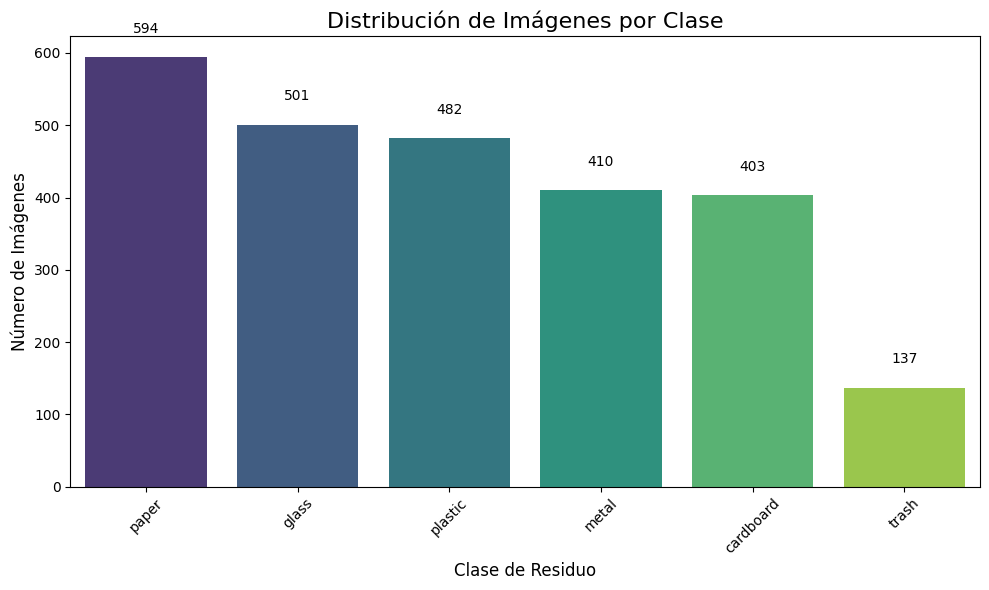


Conclusiones de la Distribución de Clases:
Se observa un desbalance significativo entre clases.
Podriamos usar las siguientes técnicas para arreglarlo:
  - Data Augmentation selectivo por clase.
  - Uso de pesos de clase ('class_weights') durante el entrenamiento.
  - Sobremuestreo de clases minoritarias.
  - Submuestreo de clases mayoritarias.


In [ ]:
# --- 2. Análisis Detallado de la Distribución de Clases ---
if not df_images.empty:
    print("\n--- Paso 2: Análisis de Distribución de Clases ---")
    class_counts = df_images['class'].value_counts()

    plt.figure(figsize=(10, 6))
    sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
    plt.title('Distribución de Imágenes por Clase', fontsize=16)
    plt.xlabel('Clase de Residuo', fontsize=12)
    plt.ylabel('Número de Imágenes', fontsize=12)
    plt.xticks(rotation=45)
    for i, count in enumerate(class_counts.values):
        plt.text(i, count + 0.05 * max(class_counts.values), str(count), ha='center', va='bottom', fontsize=10)
    plt.tight_layout()
    plt.show()

    print("\nConclusiones de la Distribución de Clases:")
    if len(class_counts) > 0:
        if class_counts.min() / class_counts.max() < 0.5: # Ejemplo de umbral para desbalance
            print("Se observa un desbalance significativo entre clases.")
            print("Podriamos usar las siguientes técnicas para arreglarlo:")
            print("  - Data Augmentation selectivo por clase.")
            print("  - Uso de pesos de clase ('class_weights') durante el entrenamiento.")
            print("  - Sobremuestreo de clases minoritarias.")
            print("  - Submuestreo de clases mayoritarias.")
        else:
            print("La distribución de clases parece relativamente balanceada.")
    else:
        print("No hay datos de clases para analizar.")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 2.")


--- Paso 3: Visualización Avanzada de Muestras ---


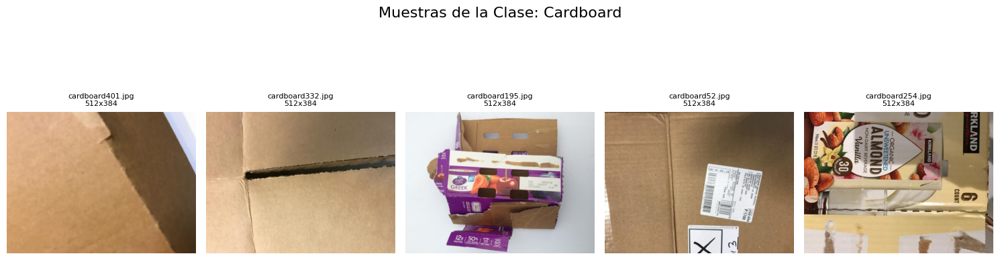

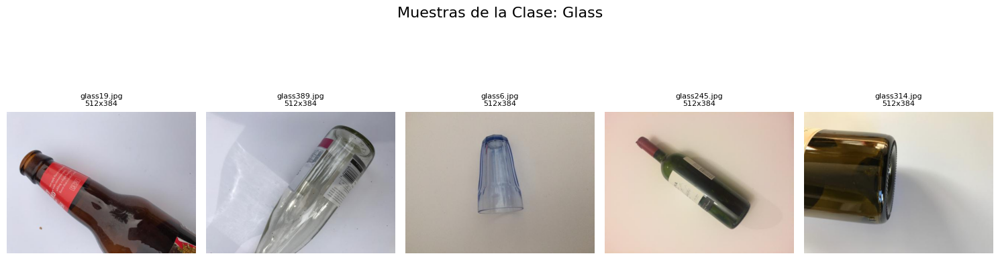

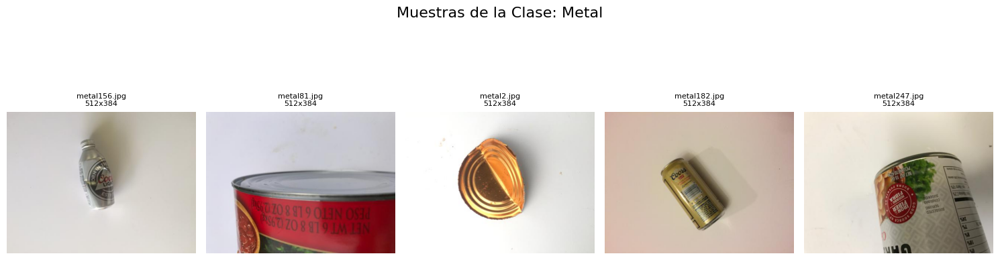

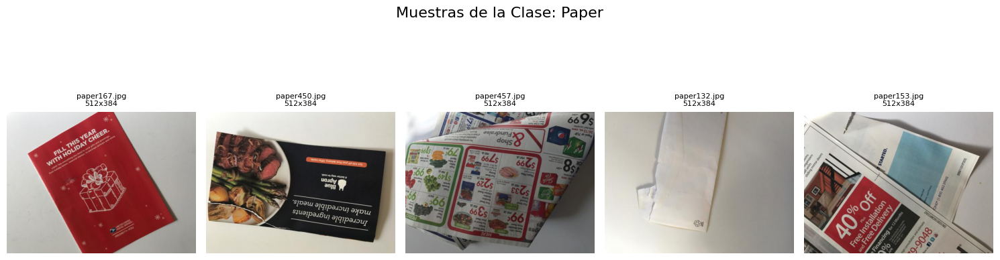

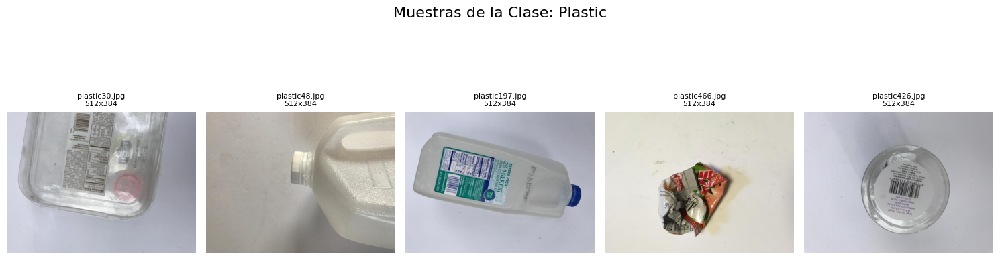

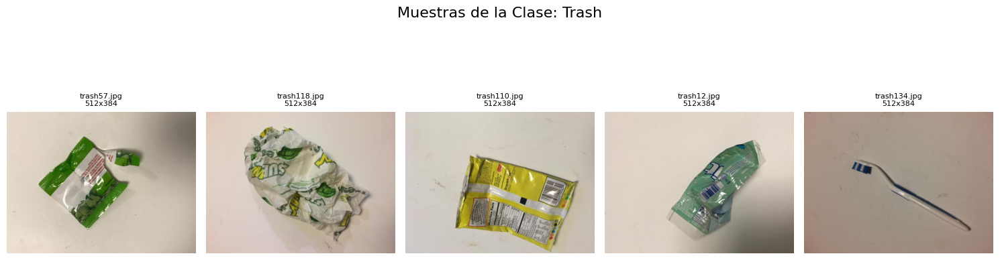


Observaciones durante la visualización de muestras:
- Variabilidad Intra-clase: ¿Cuán diferentes son las imágenes dentro de la misma clase (formas, colores, texturas, ángulos)?
- Similitud Inter-clase: ¿Hay imágenes de diferentes clases que se parecen mucho? (Ej. plástico transparente vs. vidrio)
- Calidad de imagen: ¿Son nítidas, borrosas, bien iluminadas?
- Oclusiones y Ruido: ¿Presencia de manos, otros objetos, fondos complejos?


In [ ]:
# --- 3. Visualización Avanzada de Muestras de Imágenes ---
if not df_images.empty:
    print("\n--- Paso 3: Visualización Avanzada de Muestras ---")
    num_samples_to_show_per_class = 5

    for class_name in class_names:
        plt.figure(figsize=(15, 5))
        plt.suptitle(f'Muestras de la Clase: {class_name.capitalize()}', fontsize=16)
        class_df = df_images[df_images['class'] == class_name]

        if not class_df.empty:
            sample_images = class_df.sample(min(num_samples_to_show_per_class, len(class_df)))
            for i, (_, row) in enumerate(sample_images.iterrows()):
                plt.subplot(1, num_samples_to_show_per_class, i + 1)
                try:
                    img = Image.open(row['path'])
                    plt.imshow(img)
                    plt.title(f"{row['filename']}\n{row['width']}x{row['height']}", fontsize=8)
                    plt.axis('off')
                except Exception as e:
                    print(f"Error al mostrar imagen {row['path']}: {e}")
                    plt.text(0.5, 0.5, 'Error', ha='center', va='center')
                    plt.axis('off')
        else:
            print(f"No hay imágenes para la clase '{class_name}' para mostrar.")
            plt.text(0.5, 0.5, f'No hay imágenes para {class_name}', ha='center', va='center')
            plt.axis('off')
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajustar para suptitle
        plt.show()

    print("\nObservaciones durante la visualización de muestras:")
    print("- Variabilidad Intra-clase: ¿Cuán diferentes son las imágenes dentro de la misma clase (formas, colores, texturas, ángulos)?")
    print("- Similitud Inter-clase: ¿Hay imágenes de diferentes clases que se parecen mucho? (Ej. plástico transparente vs. vidrio)")
    print("- Calidad de imagen: ¿Son nítidas, borrosas, bien iluminadas?")
    print("- Oclusiones y Ruido: ¿Presencia de manos, otros objetos, fondos complejos?")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 3.")

1. Variabilidad Intra-clase:

¿Cuán diferentes son las imágenes dentro de la misma clase?

Basado en las imágenes mostradas, hay una variabilidad significativa dentro de cada clase:

*   Plastic: Se observan diferentes tipos de plásticos - envases transparentes,botellas verdes, envases blancos, etc.... Tienen diferentes formas, transparencias y texturas.
*   Trash: La variabilidad es alta, con diferentes objetos como bandejas de plástico, botellas aplastadas, y envases transparentes.
*   Papel y otros: También presentan variabilidad en colores, formas y texturas.

Esta alta variabilidad intra-clase es la que nos puede afectar durante el desarrollo de el modelo, ya que tiene que aprender características comunes que identifiquen una clase a pesar de estas diferencias.

2. Similitud Inter-clase:

¿Hay imágenes de diferentes clases que se parecen mucho?

Sí, existen similitudes entre algunas clases:

*   Plástico transparente vs. Vidrio: Ambos pueden tener apariencia similar, transparente y brillante.
*   Plástico blanco vs. Papel: Algunas bolsas de plástico blanco pueden confundirse con papel desde ciertos ángulos.
*   Bandejas de plástico vs. bandejas de cartón: Su forma puede ser similar aunque el material sea distinto.

Estas similitudes representan otro desafío para el modelo, ya que necesitariamos que aprendiera a distinguir sutiles diferencias en textura y reflejo de luz para diferenciar materiales similares.

3. Calidad de imagen:

Las imágenes mostradas tienen:

*   Buena nitidez: La mayoría son nítidas y se pueden distinguir detalles
Iluminación variable: Algunas tienen buena iluminación mientras que otras presentan sombras o reflejos
*   Fondos consistentes: Casi todas tienen un fondo blanco/gris uniforme, lo que es positivo
*   Ángulos diversos: Los objetos están fotografiados desde diferentes ángulos y posiciones


--- Paso 4: Análisis de Dimensiones y Relaciones de Aspecto ---


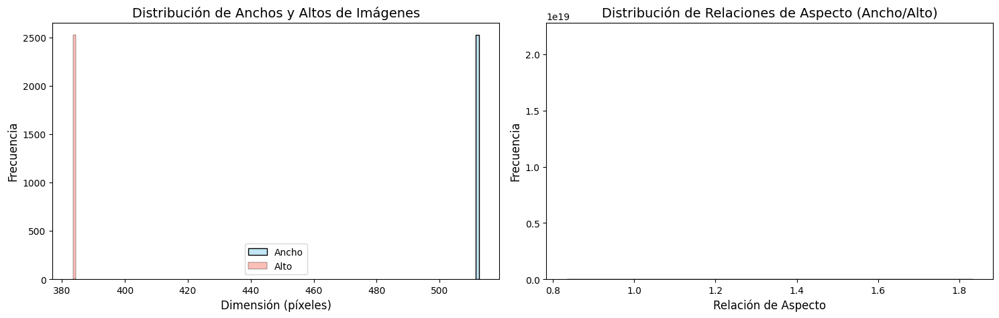

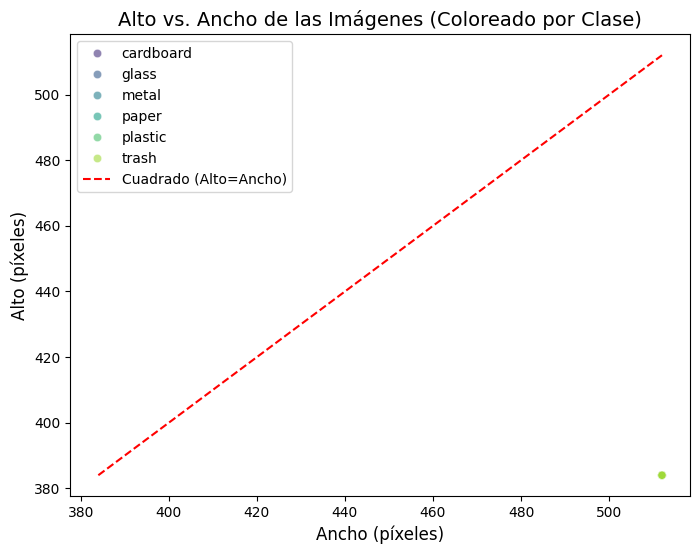


Conclusiones sobre Dimensiones:
Rango de Ancho: 512 - 512 px
Rango de Alto: 384 - 384 px
Rango de Relación de Aspecto: 1.33 - 1.33
- La mayoría de los modelos CNN requieren un tamaño de entrada fijo.
- Si hay mucha variabilidad, el redimensionamiento es crucial. Considerar:
  - Redimensionamiento directo (puede distorsionar).
  - Redimensionamiento con mantenimiento de relación de aspecto + padding.
- Tamaño objetivo predefinido para el modelo: (224, 224) (revisar si es adecuado).


In [ ]:
# --- 4. Análisis Profundo de Dimensiones y Relaciones de Aspecto ---
if not df_images.empty:
    print("\n--- Paso 4: Análisis de Dimensiones y Relaciones de Aspecto ---")

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    sns.histplot(df_images['width'], kde=True, color='skyblue', label='Ancho')
    sns.histplot(df_images['height'], kde=True, color='salmon', label='Alto')
    plt.title('Distribución de Anchos y Altos de Imágenes', fontsize=14)
    plt.xlabel('Dimensión (píxeles)', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.legend()

    plt.subplot(1, 2, 2)
    sns.histplot(df_images['aspect_ratio'], kde=True, color='lightgreen')
    plt.title('Distribución de Relaciones de Aspecto (Ancho/Alto)', fontsize=14)
    plt.xlabel('Relación de Aspecto', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df_images, x='width', y='height', hue='class', alpha=0.6, palette='viridis')
    plt.title('Alto vs. Ancho de las Imágenes (Coloreado por Clase)', fontsize=14)
    plt.xlabel('Ancho (píxeles)', fontsize=12)
    plt.ylabel('Alto (píxeles)', fontsize=12)
    # Línea para imágenes cuadradas
    min_dim = min(df_images['width'].min(), df_images['height'].min())
    max_dim = max(df_images['width'].max(), df_images['height'].max())
    plt.plot([min_dim, max_dim], [min_dim, max_dim], 'r--', label='Cuadrado (Alto=Ancho)')
    plt.legend()
    plt.show()

    print("\nConclusiones sobre Dimensiones:")
    print(f"Rango de Ancho: {df_images['width'].min()} - {df_images['width'].max()} px")
    print(f"Rango de Alto: {df_images['height'].min()} - {df_images['height'].max()} px")
    print(f"Rango de Relación de Aspecto: {df_images['aspect_ratio'].min():.2f} - {df_images['aspect_ratio'].max():.2f}")
    print("- La mayoría de los modelos CNN requieren un tamaño de entrada fijo.")
    print("- Si hay mucha variabilidad, el redimensionamiento es crucial. Considerar:")
    print("  - Redimensionamiento directo (puede distorsionar).")
    print("  - Redimensionamiento con mantenimiento de relación de aspecto + padding.")
    print(f"- Tamaño objetivo predefinido para el modelo: {IMAGE_SIZE} (revisar si es adecuado).")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 4.")


#--# Redimensionamiento optimizado:
#Si se requiere un tamaño diferente para el modelo (por razones de eficiencia), considerar mantener la relación de aspecto 4:3
#Tamaños recomendados que conservan la relación 4:3: 224x168, 256x192, 384x288, 448x336

Análisis:

1. Dimensiones uniformes:

El gráfico muestra que casi todas las imágenes tienen dimensiones idénticas (cerca de 512 x 384 píxeles)
Hay muy poca variabilidad en las dimensiones


2. Relación de aspecto constante:

La mayoría de las imágenes tiene una relación de aspecto entre 1.33 - 1.33 (4:3)
Esta uniformidad podria sugerir que las imágenes fueron capturadas con la misma cámara/configuración



Dado que las imágenes ya tienen dimensiones consistentes, creemos que no es necesario un preprocesamiento de las dimensiones. Podriamos utilizar directamente el tamaño 512x384 para el modelo, lo cual conservaría todos los detalles originales.



--- Paso 5: Análisis de Canales de Color e Intensidad ---
Modos de imagen encontrados:
mode
RGB    2527
Name: count, dtype: int64
Número de canales encontrados:
channels
3    2527
Name: count, dtype: int64

Histogramas de Color para la clase: cardboard


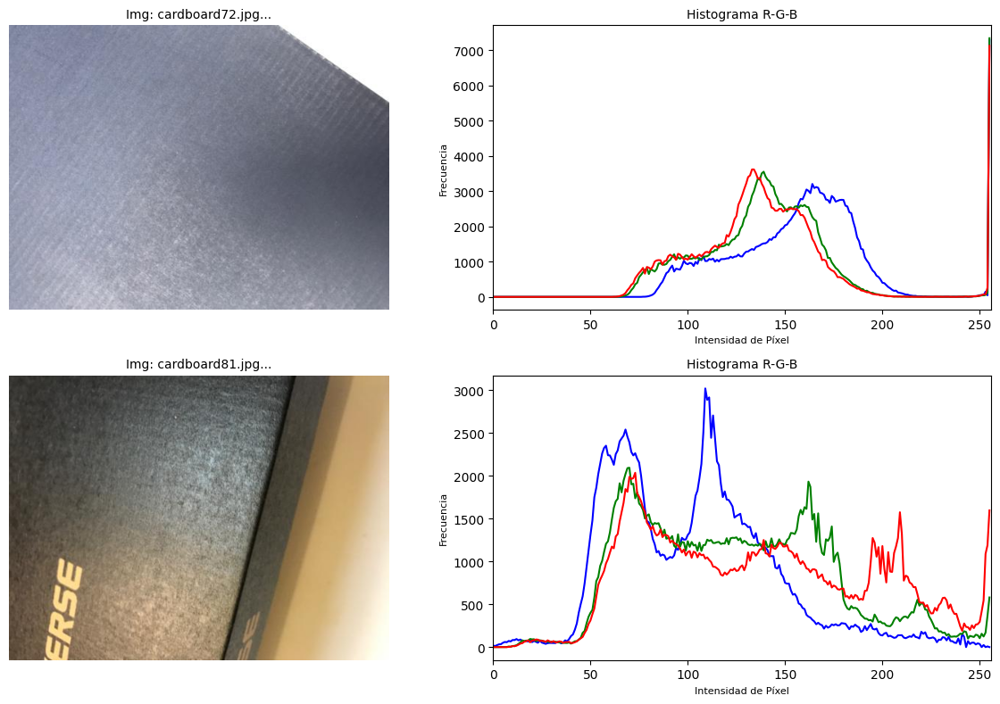


Histogramas de Color para la clase: glass


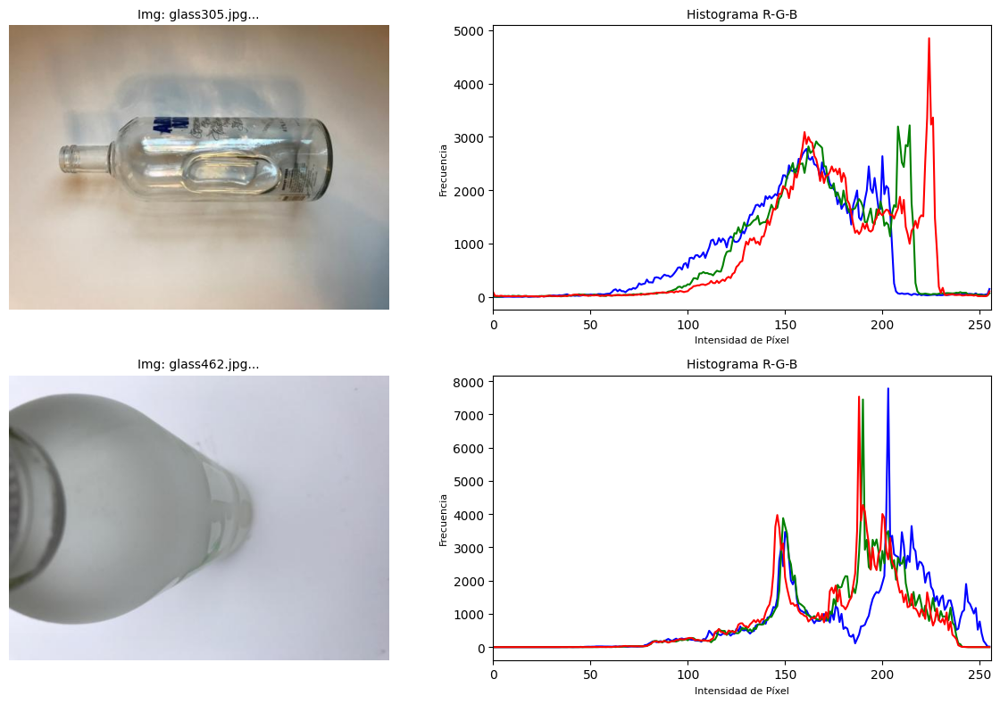


Histogramas de Color para la clase: metal


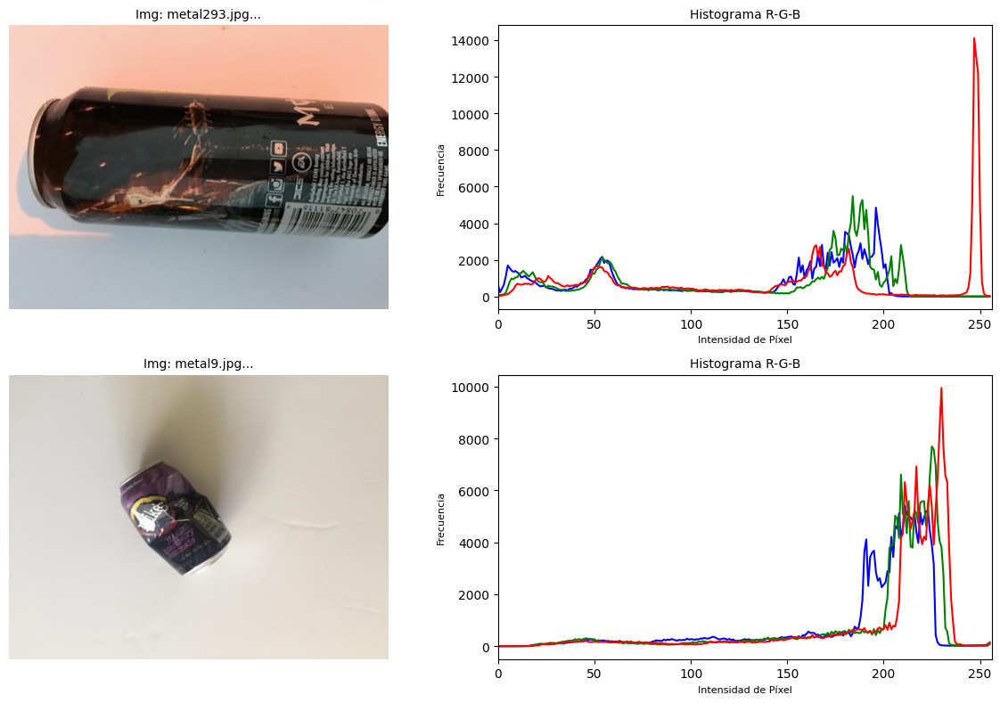


Histogramas de Color para la clase: paper


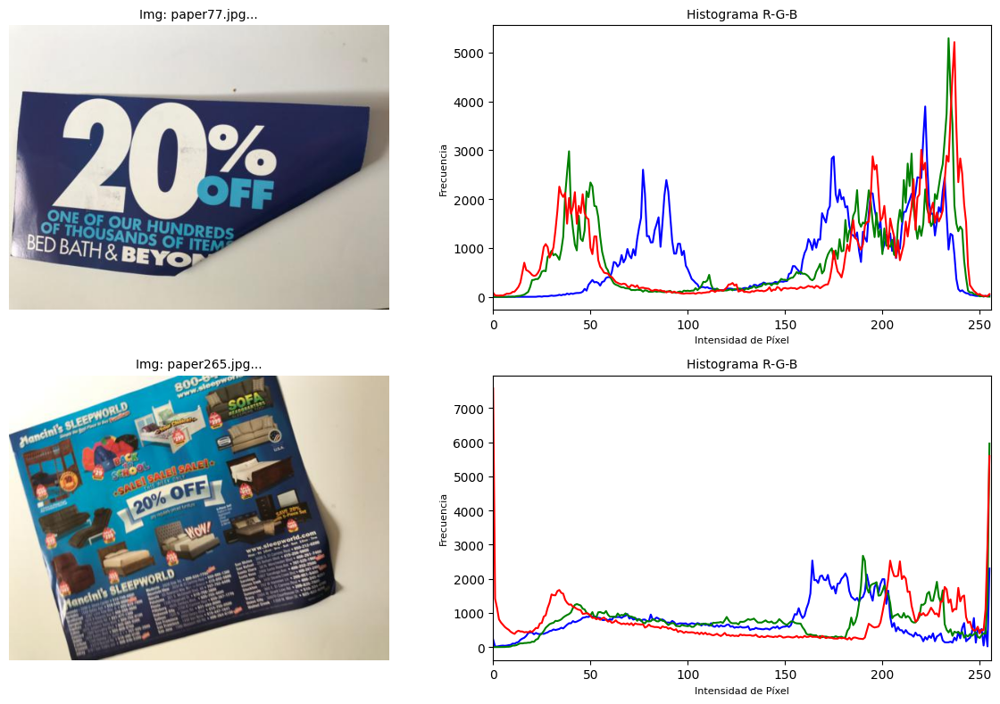


Histogramas de Color para la clase: plastic


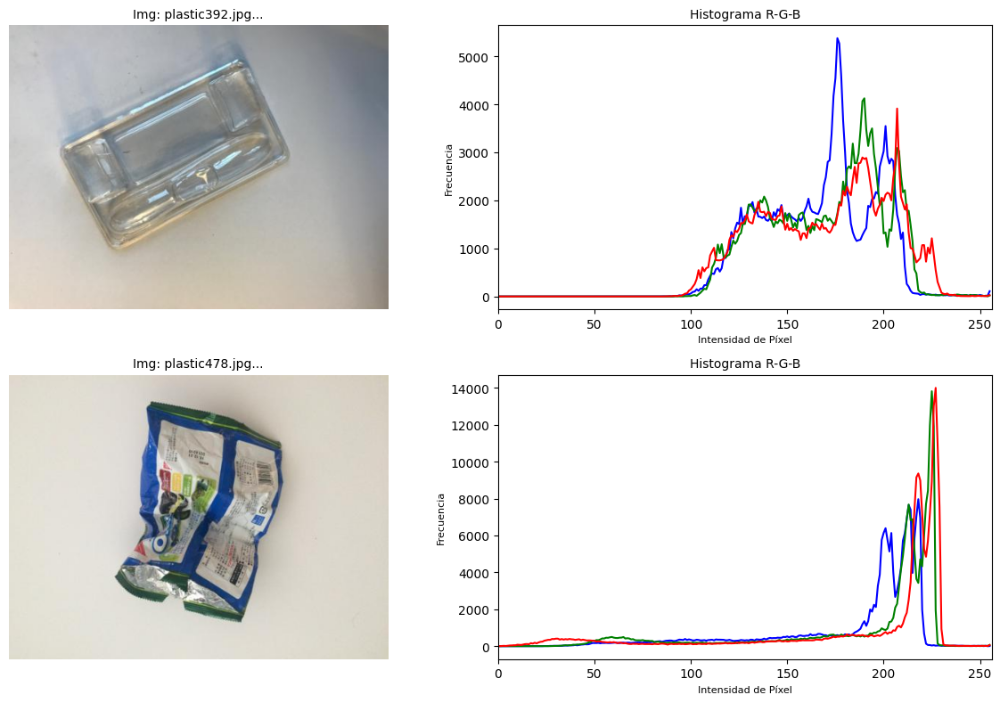


Histogramas de Color para la clase: trash


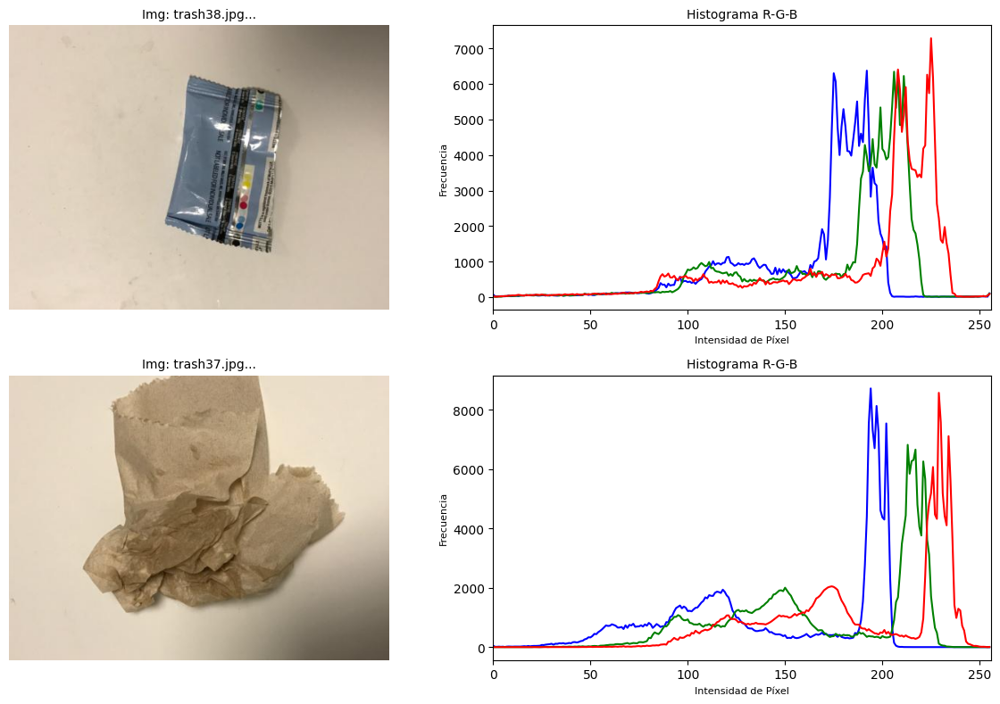


Conclusiones sobre Color:
- El color parece ser una característica distintiva importante para los residuos (ej. vidrio verde/marrón, ciertos plásticos).
- Asegurar que todas las imágenes se procesen con 3 canales (RGB) para modelos estándar.
- Las distribuciones de intensidad pueden revelar si las imágenes son consistentemente brillantes/oscuras en ciertos canales.


In [ ]:
# --- 5. Análisis Detallado de Canales de Color e Intensidad ---
if not df_images.empty:
    print("\n--- Paso 5: Análisis de Canales de Color e Intensidad ---")

    print("Modos de imagen encontrados:")
    print(df_images['mode'].value_counts())
    print("Número de canales encontrados:")
    print(df_images['channels'].value_counts())

    if not (df_images['mode'] == 'RGB').all() or not (df_images['channels'] == 3).all():
        print("ADVERTENCIA: No todas las imágenes son RGB de 3 canales. Se necesitará conversión o manejo especial.")
        # Ejemplo de cómo convertir (no se ejecuta aquí, solo informativo):
        # img_pil = Image.open(path).convert('RGB')

    # Mostrar histogramas de color para algunas imágenes de muestra por clase
    num_samples_hist_color = 2
    for class_name in class_names:
        print(f"\nHistogramas de Color para la clase: {class_name}")
        class_df = df_images[df_images['class'] == class_name]
        if not class_df.empty:
            sample_images_color = class_df.sample(min(num_samples_hist_color, len(class_df)))
            plt.figure(figsize=(12, num_samples_hist_color * 4))
            for i, (_, row) in enumerate(sample_images_color.iterrows()):
                try:
                    cv_img = cv2.imread(row['path'])
                    if cv_img is not None:
                        plt.subplot(num_samples_hist_color, 2, i * 2 + 1)
                        plt.imshow(cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB))
                        plt.title(f"Img: {row['filename'][:20]}...", fontsize=10)
                        plt.axis('off')

                        plt.subplot(num_samples_hist_color, 2, i * 2 + 2)
                        colors = ('b', 'g', 'r') # OpenCV lee en BGR
                        for channel_idx, color in enumerate(colors):
                            hist = cv2.calcHist([cv_img], [channel_idx], None, [256], [0, 256])
                            plt.plot(hist, color=color)
                        plt.title('Histograma R-G-B', fontsize=10)
                        plt.xlabel('Intensidad de Píxel', fontsize=8)
                        plt.ylabel('Frecuencia', fontsize=8)
                        plt.xlim([0, 256])
                    else:
                         print(f"No se pudo leer {row['path']} con OpenCV para histograma.")
                except Exception as e:
                    print(f"Error al generar histograma para {row['path']}: {e}")
            plt.tight_layout()
            plt.show()

    print("\nConclusiones sobre Color:")
    print("- El color parece ser una característica distintiva importante para los residuos (ej. vidrio verde/marrón, ciertos plásticos).")
    print("- Asegurar que todas las imágenes se procesen con 3 canales (RGB) para modelos estándar.")
    print("- Las distribuciones de intensidad pueden revelar si las imágenes son consistentemente brillantes/oscuras en ciertos canales.")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 5.")

In [ ]:
# Código para análisis y extracción de características de color en el dataset TrashNet

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from tqdm import tqdm
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.efficientnet import preprocess_input
import joblib
import seaborn as sns
import random
from skimage.feature import graycomatrix, graycoprops

# Definir nombres de clases
class_names = ['paper', 'glass', 'plastic', 'metal', 'cardboard', 'trash']

def analizar_estadisticas_color(dataset_path, sample_size=None):
    """
    Analiza estadísticas de color detalladas para cada clase en el dataset.

    Args:
        dataset_path: Ruta al dataset
        sample_size: Tamaño de muestra por clase (None para usar todas)

    Returns:
        DataFrame con estadísticas de color por imagen
    """
    print("Analizando estadísticas de color por clase...")

    # Lista para almacenar resultados
    resultados = []

    # Procesar cada clase
    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # Tomar muestra si se especifica
        if sample_size is not None and sample_size < len(imagenes):
            random.seed(42)  # Para reproducibilidad
            imagenes = random.sample(imagenes, sample_size)

        print(f"Procesando {len(imagenes)} imágenes de la clase '{class_name}'...")

        # Procesar cada imagen
        for img_name in tqdm(imagenes):
            img_path = os.path.join(class_path, img_name)

            # Leer imagen con OpenCV (BGR)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Convertir a RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Obtener canales
            r_channel = img_rgb[:,:,0]
            g_channel = img_rgb[:,:,1]
            b_channel = img_rgb[:,:,2]

            # Convertir a HSV para análisis adicional
            img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
            h_channel = img_hsv[:,:,0]
            s_channel = img_hsv[:,:,1]
            v_channel = img_hsv[:,:,2]

            # Calcular histogramas
            hist_r = cv2.calcHist([r_channel], [0], None, [256], [0, 256])
            hist_g = cv2.calcHist([g_channel], [0], None, [256], [0, 256])
            hist_b = cv2.calcHist([b_channel], [0], None, [256], [0, 256])
            hist_h = cv2.calcHist([h_channel], [0], None, [180], [0, 180])
            hist_s = cv2.calcHist([s_channel], [0], None, [256], [0, 256])
            hist_v = cv2.calcHist([v_channel], [0], None, [256], [0, 256])

            # Normalizar histogramas
            area = img_rgb.shape[0] * img_rgb.shape[1]
            hist_r = hist_r / area
            hist_g = hist_g / area
            hist_b = hist_b / area
            hist_h = hist_h / area
            hist_s = hist_s / area
            hist_v = hist_v / area

            # Extraer características de color
            # 1. Estadísticas básicas por canal
            stats_r = {
                'r_mean': np.mean(r_channel),
                'r_std': np.std(r_channel),
                'r_median': np.median(r_channel),
                'r_min': np.min(r_channel),
                'r_max': np.max(r_channel),
                'r_q1': np.percentile(r_channel, 25),
                'r_q3': np.percentile(r_channel, 75),
            }

            stats_g = {
                'g_mean': np.mean(g_channel),
                'g_std': np.std(g_channel),
                'g_median': np.median(g_channel),
                'g_min': np.min(g_channel),
                'g_max': np.max(g_channel),
                'g_q1': np.percentile(g_channel, 25),
                'g_q3': np.percentile(g_channel, 75),
            }

            stats_b = {
                'b_mean': np.mean(b_channel),
                'b_std': np.std(b_channel),
                'b_median': np.median(b_channel),
                'b_min': np.min(b_channel),
                'b_max': np.max(b_channel),
                'b_q1': np.percentile(b_channel, 25),
                'b_q3': np.percentile(b_channel, 75),
            }

            # 2. Estadísticas del espacio HSV
            stats_hsv = {
                'h_mean': np.mean(h_channel),
                'h_std': np.std(h_channel),
                's_mean': np.mean(s_channel),
                's_std': np.std(s_channel),
                'v_mean': np.mean(v_channel),
                'v_std': np.std(v_channel),
            }

            # 3. Características avanzadas
            # Relaciones entre canales
            stats_relaciones = {
                'r_g_ratio': np.mean(r_channel) / (np.mean(g_channel) + 1e-6),
                'r_b_ratio': np.mean(r_channel) / (np.mean(b_channel) + 1e-6),
                'g_b_ratio': np.mean(g_channel) / (np.mean(b_channel) + 1e-6),
                'brightness': (np.mean(r_channel) + np.mean(g_channel) + np.mean(b_channel)) / 3,
                'saturation': np.mean(s_channel),
            }

            # 4. Análisis de picos en histogramas
            # Encontrar picos significativos en histogramas
            def encontrar_picos(hist, umbral_pico=0.005):
                picos = []
                for i in range(1, len(hist)-1):
                    if hist[i] > hist[i-1] and hist[i] > hist[i+1] and hist[i] > umbral_pico:
                        picos.append((i, hist[i][0]))
                return sorted(picos, key=lambda x: x[1], reverse=True)[:3]  # Top 3 picos

            picos_r = encontrar_picos(hist_r)
            picos_g = encontrar_picos(hist_g)
            picos_b = encontrar_picos(hist_b)
            picos_h = encontrar_picos(hist_h)

            # Extraer posiciones de los picos principales
            stats_picos = {}
            for i, (pos, val) in enumerate(picos_r[:min(3, len(picos_r))]):
                stats_picos[f'r_peak{i+1}_pos'] = pos
                stats_picos[f'r_peak{i+1}_val'] = val

            for i, (pos, val) in enumerate(picos_g[:min(3, len(picos_g))]):
                stats_picos[f'g_peak{i+1}_pos'] = pos
                stats_picos[f'g_peak{i+1}_val'] = val

            for i, (pos, val) in enumerate(picos_b[:min(3, len(picos_b))]):
                stats_picos[f'b_peak{i+1}_pos'] = pos
                stats_picos[f'b_peak{i+1}_val'] = val

            for i, (pos, val) in enumerate(picos_h[:min(3, len(picos_h))]):
                stats_picos[f'h_peak{i+1}_pos'] = pos
                stats_picos[f'h_peak{i+1}_val'] = val

            # 5. Análisis de texturas basado en color
            # Calcular matrices de co-ocurrencia para textura

            # Convertir a escala de grises para análisis de textura
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # Reducir niveles de gris para matrices de co-ocurrencia más eficientes
            gray_scaled = (gray / 32).astype(np.uint8)

            # Calcular matriz de co-ocurrencia
            try:
                glcm = graycomatrix(gray_scaled, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], levels=8, symmetric=True, normed=True)

                # Extraer propiedades
                stats_textura = {
                    'contrast': np.mean(graycoprops(glcm, 'contrast')),
                    'dissimilarity': np.mean(graycoprops(glcm, 'dissimilarity')),
                    'homogeneity': np.mean(graycoprops(glcm, 'homogeneity')),
                    'energy': np.mean(graycoprops(glcm, 'energy')),
                    'correlation': np.mean(graycoprops(glcm, 'correlation')),
                }
            except Exception as e:
                print(f"Error en análisis de textura para {img_path}: {e}")
                stats_textura = {
                    'contrast': 0,
                    'dissimilarity': 0,
                    'homogeneity': 0,
                    'energy': 0,
                    'correlation': 0,
                }

            # Combinar todas las estadísticas
            stats_imagen = {
                'filename': img_name,
                'class': class_name,
                'class_id': class_idx,
                'width': img.shape[1],
                'height': img.shape[0],
                'aspect_ratio': img.shape[1] / img.shape[0],
            }

            # Añadir todas las estadísticas
            stats_imagen.update(stats_r)
            stats_imagen.update(stats_g)
            stats_imagen.update(stats_b)
            stats_imagen.update(stats_hsv)
            stats_imagen.update(stats_relaciones)
            stats_imagen.update(stats_picos)
            stats_imagen.update(stats_textura)

            # Añadir a la lista de resultados
            resultados.append(stats_imagen)

    # Crear DataFrame
    df_stats = pd.DataFrame(resultados)

    # Guardar resultados
    df_stats.to_csv('estadisticas_color_trashnet.csv', index=False)

    print(f"Análisis completado. Se procesaron {len(df_stats)} imágenes.")
    print(f"Resultados guardados en 'estadisticas_color_trashnet.csv'")

    return df_stats

def visualizar_distribucion_color_por_clase(df_stats):
    """
    Visualiza la distribución de características de color por clase.

    Args:
        df_stats: DataFrame con estadísticas de color
    """
    print("Generando visualizaciones de distribución de color por clase...")

    # Características importantes para analizar
    caracteristicas = [
        'r_mean', 'g_mean', 'b_mean',
        'h_mean', 's_mean', 'v_mean',
        'brightness', 'saturation',
        'contrast', 'homogeneity'
    ]

    # Crear gráficos de distribución
    for feature in caracteristicas:
        plt.figure(figsize=(12, 8))

        for class_name in class_names:
            # Filtrar por clase
            class_data = df_stats[df_stats['class'] == class_name][feature]

            # Graficar distribución
            plt.hist(class_data, alpha=0.5, label=class_name, bins=30)

        plt.title(f'Distribución de {feature} por Clase')
        plt.xlabel(feature)
        plt.ylabel('Frecuencia')
        plt.legend()
        plt.tight_layout()
        plt.savefig(f'distribucion_{feature}_por_clase.png')
        plt.close()

    # Relación entre canales RGB por clase
    plt.figure(figsize=(12, 8))
    for class_name in class_names:
        class_data = df_stats[df_stats['class'] == class_name]
        plt.scatter(class_data['r_mean'], class_data['g_mean'], alpha=0.5, label=class_name)

    plt.title('Relación entre Canales R y G por Clase')
    plt.xlabel('Media Canal R')
    plt.ylabel('Media Canal G')
    plt.legend()
    plt.tight_layout()
    plt.savefig('relacion_r_g_por_clase.png')
    plt.close()

    # Relación entre saturación y brillo por clase
    plt.figure(figsize=(12, 8))
    for class_name in class_names:
        class_data = df_stats[df_stats['class'] == class_name]
        plt.scatter(class_data['saturation'], class_data['brightness'], alpha=0.5, label=class_name)

    plt.title('Relación entre Saturación y Brillo por Clase')
    plt.xlabel('Saturación')
    plt.ylabel('Brillo')
    plt.legend()
    plt.tight_layout()
    plt.savefig('relacion_saturacion_brillo_por_clase.png')
    plt.close()

    print("Visualizaciones guardadas como archivos PNG.")

def crear_histogramas_color_por_clase(dataset_path, num_muestras=3):
    """
    Crea histogramas de color para muestras representativas de cada clase.

    Args:
        dataset_path: Ruta al dataset
        num_muestras: Número de imágenes de muestra por clase
    """
    print("Creando histogramas de color por clase...")

    plt.figure(figsize=(15, len(class_names) * 4))
    plot_idx = 1

    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # Tomar muestras aleatorias
        random.seed(42)  # Para reproducibilidad
        if len(imagenes) > num_muestras:
            muestras = random.sample(imagenes, num_muestras)
        else:
            muestras = imagenes

        for img_name in muestras:
            img_path = os.path.join(class_path, img_name)

            # Leer imagen con OpenCV (BGR)
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Convertir a RGB para visualización
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Obtener canales
            r_channel = img_rgb[:,:,0]
            g_channel = img_rgb[:,:,1]
            b_channel = img_rgb[:,:,2]

            # Calcular histogramas
            hist_r = cv2.calcHist([r_channel], [0], None, [256], [0, 256])
            hist_g = cv2.calcHist([g_channel], [0], None, [256], [0, 256])
            hist_b = cv2.calcHist([b_channel], [0], None, [256], [0, 256])

            # Normalizar histogramas
            hist_r = hist_r / (np.sum(hist_r) + 1e-7) * 100
            hist_g = hist_g / (np.sum(hist_g) + 1e-7) * 100
            hist_b = hist_b / (np.sum(hist_b) + 1e-7) * 100

            # Mostrar imagen
            plt.subplot(len(class_names) * num_muestras, 2, plot_idx)
            plt.imshow(img_rgb)
            plt.title(f"{class_name}: {img_name[:10]}...", fontsize=8)
            plt.axis('off')

            # Mostrar histogramas
            plt.subplot(len(class_names) * num_muestras, 2, plot_idx + 1)
            plt.plot(hist_r, color='red', label='R')
            plt.plot(hist_g, color='green', label='G')
            plt.plot(hist_b, color='blue', label='B')
            plt.title('Histograma RGB', fontsize=8)
            plt.xlabel('Intensidad de Pixel', fontsize=7)
            plt.ylabel('Frecuencia (%)', fontsize=7)
            plt.xlim([0, 256])
            plt.legend(fontsize=7)
            plt.tight_layout()

            plot_idx += 2

    plt.tight_layout()
    plt.savefig('histogramas_color_por_clase.png')
    plt.close()

    print("Histogramas de color guardados como 'histogramas_color_por_clase.png'")

def crear_caracteristicas_color(df_stats):
    """
    Prepara un conjunto de características de color para clasificación.

    Args:
        df_stats: DataFrame con estadísticas de color

    Returns:
        X, y: Características y etiquetas para clasificación
    """
    print("Preparando características de color para clasificación...")

    # Seleccionar características relevantes (basado en el análisis previo)
    features = [
        # Estadísticas RGB
        'r_mean', 'g_mean', 'b_mean',
        'r_std', 'g_std', 'b_std',

        # Estadísticas HSV
        'h_mean', 's_mean', 'v_mean',
        'h_std', 's_std', 'v_std',

        # Relaciones entre canales
        'r_g_ratio', 'r_b_ratio', 'g_b_ratio',
        'brightness', 'saturation',

        # Textura
        'contrast', 'dissimilarity', 'homogeneity',
        'energy', 'correlation',

        # Posiciones de picos (si existen en el DataFrame)
    ]

    # Añadir columnas de picos si existen
    pico_cols = [col for col in df_stats.columns if col.startswith(('r_peak', 'g_peak', 'b_peak', 'h_peak'))]
    features.extend(pico_cols)

    # Verificar que todas las columnas existan
    features = [f for f in features if f in df_stats.columns]

    # Crear matriz de características y vector de etiquetas
    X = df_stats[features].copy()
    y = df_stats['class_id'].copy()

    # Manejar valores faltantes (si los hay)
    X = X.fillna(0)

    print(f"Conjunto de características creado con {X.shape[1]} variables.")

    return X, y

def evaluar_importancia_caracteristicas(X, y):
    """
    Evalúa la importancia de las características de color para la clasificación.

    Args:
        X: Matriz de características
        y: Vector de etiquetas
    """
    print("Evaluando importancia de características de color...")

    # Escalar características
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Crear y entrenar un Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_scaled, y)

    # Obtener importancia de características
    importances = rf.feature_importances_
    indices = np.argsort(importances)[::-1]

    # Mostrar importancia
    plt.figure(figsize=(12, 8))
    plt.title('Importancia de Características de Color')
    plt.bar(range(X.shape[1]), importances[indices], align='center')
    plt.xticks(range(X.shape[1]), [X.columns[i] for i in indices], rotation=90)
    plt.tight_layout()
    plt.savefig('importancia_caracteristicas_color.png')
    plt.close()

    # Mostrar las 10 características más importantes
    print("\nCaracterísticas más importantes:")
    for i in range(min(10, X.shape[1])):
        print(f"{i+1}. {X.columns[indices[i]]}: {importances[indices[i]]:.4f}")

    # Validación cruzada para evaluar rendimiento
    from sklearn.model_selection import cross_val_score
    scores = cross_val_score(rf, X_scaled, y, cv=5)
    print(f"\nPrecisión con características de color (validación cruzada 5-fold): {np.mean(scores):.4f} ± {np.std(scores):.4f}")

#def crear_modelo_combinado(dataset_path, df_stats):
    """
    Crea un modelo que combina características de color con características
    extraídas de una red neuronal preentrenada.

    Args:
        dataset_path: Ruta al dataset
        df_stats: DataFrame con estadísticas de color
    """
    print("Creando modelo combinado (características de color + CNN)...")

    # 1. Preparar características de color
    X_color, y = crear_caracteristicas_color(df_stats)

    # Escalar características
    scaler_color = StandardScaler()
    X_color_scaled = scaler_color.fit_transform(X_color)

    # 2. Extraer características CNN
    from tensorflow.keras.applications import EfficientNetB0

    # Cargar modelo base preentrenado
    base_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

    print("Extrayendo características CNN de las imágenes...")

    # Lista para almacenar características
    cnn_features = []
    filenames = []

    # Procesar cada imagen
    for idx, row in tqdm(df_stats.iterrows(), total=len(df_stats)):
        img_path = os.path.join(dataset_path, row['class'], row['filename'])

        try:
            # Cargar y preprocesar imagen
            img = load_img(img_path, target_size=(224, 224))
            x = img_to_array(img)
            x = np.expand_dims(x, axis=0)
            x = preprocess_input(x)

            # Extraer características
            features = base_model.predict(x, verbose=0)

            # Añadir a la lista
            cnn_features.append(features.flatten())
            filenames.append(row['filename'])
        except Exception as e:
            print(f"Error procesando {img_path}: {e}")

    # Convertir a array numpy
    X_cnn = np.array(cnn_features)

    print(f"Características CNN extraídas. Forma: {X_cnn.shape}")

    # 3. Combinar características
    # Asegurar que las filas corresponden a las mismas imágenes
    df_cnn = pd.DataFrame({
        'filename': filenames,
        **{f'cnn_{i}': X_cnn[:, i] for i in range(X_cnn.shape[1])}
    })

    # Combinar en un único DataFrame
    df_combined = pd.merge(
        df_stats[['filename', 'class', 'class_id']],
        df_cnn,
        on='filename',
        how='inner'
    )

    # Verificar que tenemos todas las filas
    print(f"Conjunto combinado con {len(df_combined)} filas.")

    # División en conjuntos de entrenamiento y prueba
    X_combined = np.hstack([X_color_scaled, X_cnn])
    y_combined = df_combined['class_id'].values

    X_train, X_test, y_train, y_test = train_test_split(
        X_combined, y_combined, test_size=0.2, random_state=42, stratify=y_combined
    )

    # 4. Entrenar modelo (Random Forest)
    rf_combined = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_combined.fit(X_train, y_train)

    # 5. Evaluar modelo
    y_pred = rf_combined.predict(X_test)

    print("\nReporte de clasificación del modelo combinado:")
    print(classification_report(y_test, y_pred, target_names=class_names))

    # Matriz de confusión
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.xlabel('Predicción')
    plt.ylabel('Verdadero')
    plt.title('Matriz de Confusión - Modelo Combinado')
    plt.tight_layout()
    plt.savefig('matriz_confusion_combinada.png')
    plt.close()

    # Guardar el modelo y el escalador de color
    joblib.dump(rf_combined, 'modelo_combinado_trashnet.pkl')
    joblib.dump(scaler_color, 'scaler_caracteristicas_color.pkl')

    print("Modelo combinado guardado como 'modelo_combinado_trashnet.pkl'")
    print("Escalador de características de color guardado como 'scaler_caracteristicas_color.pkl'")

def main():
    """
    Función principal que ejecuta el análisis de color y crea el modelo.
    """
    # Configurar ruta al dataset
    dataset_path = '/content/trashnet_images/dataset-resized'

    if not os.path.exists(dataset_path):
        print(f"¡Error! No se encontró el dataset en la ruta: {dataset_path}")
        return

    # Paso 1: Analizar estadísticas de color
    df_stats = analizar_estadisticas_color(dataset_path, sample_size=None)

    if df_stats is not None and not df_stats.empty:
        # Paso 2: Visualizar distribución de color por clase
        visualizar_distribucion_color_por_clase(df_stats)

        # Paso 3: Crear histogramas de color por clase
        crear_histogramas_color_por_clase(dataset_path)

        # Paso 4: Evaluar importancia de características de color
        X, y = crear_caracteristicas_color(df_stats)
        if not X.empty:
            evaluar_importancia_caracteristicas(X, y)
        else:
            print("No se pudieron crear características de color. Omitiendo evaluación de importancia.")

        # Paso 5: Crear modelo combinado (características de color + CNN)
        crear_modelo_combinado(dataset_path, df_stats)

        print("\n===== RESUMEN DEL ANÁLISIS DE COLOR =====")
        print("1. Se analizaron las características de color de todas las imágenes.")
        print("2. Se generaron visualizaciones de distribución de color por clase.")
        print("3. Se crearon histogramas de color para muestras representativas.")
        print("4. Se evaluó la importancia de las características de color para la clasificación.")
        print("5. Se creó un modelo combinado usando características de color y CNN.")
        print("===== FIN DEL ANÁLISIS =====")
    else:
        print("No se pudieron analizar las estadísticas de color. Asegúrate de que el dataset exista y contenga imágenes.")

if __name__ == "__main__":
    main()

Analizando estadísticas de color por clase...
Procesando 594 imágenes de la clase 'paper'...


100%|██████████| 594/594 [00:25<00:00, 23.02it/s]


Procesando 501 imágenes de la clase 'glass'...


100%|██████████| 501/501 [00:19<00:00, 26.34it/s]


Procesando 482 imágenes de la clase 'plastic'...


100%|██████████| 482/482 [00:19<00:00, 24.56it/s]


Procesando 410 imágenes de la clase 'metal'...


100%|██████████| 410/410 [00:17<00:00, 23.74it/s]


Procesando 403 imágenes de la clase 'cardboard'...


100%|██████████| 403/403 [00:16<00:00, 24.67it/s]


Procesando 137 imágenes de la clase 'trash'...


100%|██████████| 137/137 [00:06<00:00, 22.83it/s]


Análisis completado. Se procesaron 2527 imágenes.
Resultados guardados en 'estadisticas_color_trashnet.csv'
Generando visualizaciones de distribución de color por clase...
Visualizaciones guardadas como archivos PNG.
Creando histogramas de color por clase...
Histogramas de color guardados como 'histogramas_color_por_clase.png'
Preparando características de color para clasificación...
Conjunto de características creado con 46 variables.
Evaluando importancia de características de color...

Características más importantes:
1. g_b_ratio: 0.0411
2. h_mean: 0.0378
3. r_g_ratio: 0.0377
4. r_b_ratio: 0.0361
5. h_peak1_pos: 0.0342
6. s_mean: 0.0328
7. saturation: 0.0300
8. v_std: 0.0299
9. h_std: 0.0290
10. g_std: 0.0289

Precisión con características de color (validación cruzada 5-fold): 0.7265 ± 0.0090
Creando modelo combinado (características de color + CNN)...
Preparando características de color para clasificación...
Conjunto de características creado con 46 variables.
16705208/16705208 ━━

100%|██████████| 2527/2527 [09:28<00:00,  4.45it/s]


Características CNN extraídas. Forma: (2527, 1280)
Conjunto combinado con 2527 filas.

Reporte de clasificación del modelo combinado:
              precision    recall  f1-score   support

       paper       0.82      0.97      0.89       119
       glass       0.86      0.89      0.87       100
     plastic       0.82      0.82      0.82        97
       metal       0.86      0.87      0.86        82
   cardboard       0.99      0.86      0.92        81
       trash       0.90      0.33      0.49        27

    accuracy                           0.86       506
   macro avg       0.87      0.79      0.81       506
weighted avg       0.86      0.86      0.85       506

Modelo combinado guardado como 'modelo_combinado_trashnet.pkl'
Escalador de características de color guardado como 'scaler_caracteristicas_color.pkl'

===== RESUMEN DEL ANÁLISIS DE COLOR =====
1. Se analizaron las características de color de todas las imágenes.
2. Se generaron visualizaciones de distribución de color por 


--- Paso 6: Análisis de Brillo ---


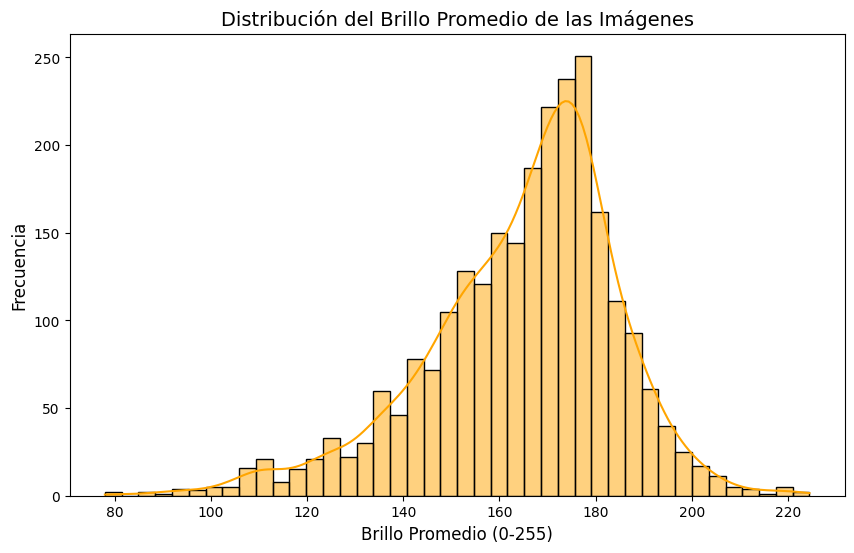

Imágenes con bajo brillo (percentil 5% = 126.02):


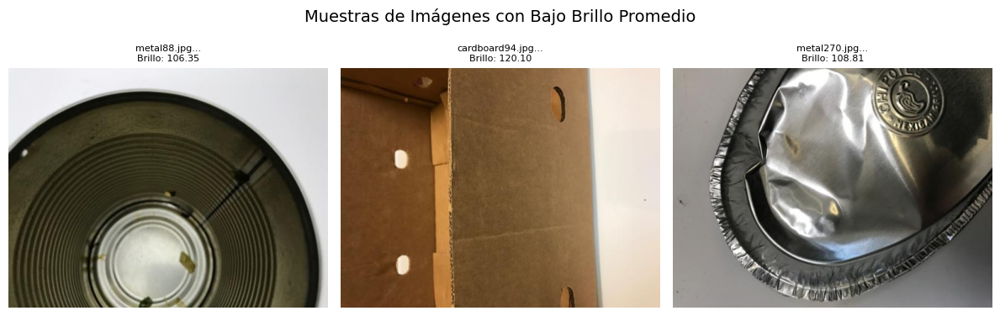

Imágenes con alto brillo (percentil 95% = 191.84):


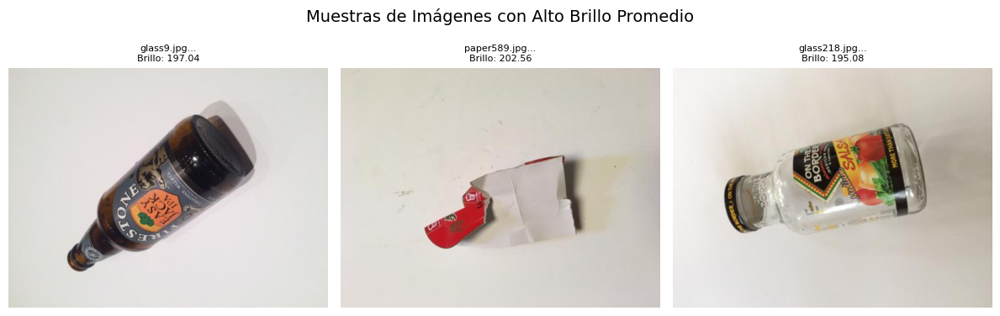


Conclusiones sobre Brillo:
- Una gran variabilidad en el brillo puede dificultar el aprendizaje del modelo.
- Considerar técnicas de normalización de brillo o aumento de datos que modifiquen el brillo/contraste.
- Imágenes extremadamente oscuras o brillantes pueden perder detalles importantes.


In [ ]:
# --- 6. Análisis de Brillo ---
if not df_images.empty:
    print("\n--- Paso 6: Análisis de Brillo ---")

    plt.figure(figsize=(10, 6))
    sns.histplot(df_images['avg_brightness'], kde=True, color='orange')
    plt.title('Distribución del Brillo Promedio de las Imágenes', fontsize=14)
    plt.xlabel('Brillo Promedio (0-255)', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.show()

    # Mostrar imágenes con brillo extremo (si existen y son informativas)
    low_brightness_threshold = df_images['avg_brightness'].quantile(0.05) # 5% más oscuras
    high_brightness_threshold = df_images['avg_brightness'].quantile(0.95) # 5% más claras

    print(f"Imágenes con bajo brillo (percentil 5% = {low_brightness_threshold:.2f}):")
    low_brightness_samples = df_images[df_images['avg_brightness'] <= low_brightness_threshold].sample(min(3, len(df_images[df_images['avg_brightness'] <= low_brightness_threshold])))
    if not low_brightness_samples.empty:
        plt.figure(figsize=(12,4))
        for i, (_, row) in enumerate(low_brightness_samples.iterrows()):
            plt.subplot(1, 3, i+1)
            img = Image.open(row['path'])
            plt.imshow(img)
            plt.title(f"{row['filename'][:15]}...\nBrillo: {row['avg_brightness']:.2f}", fontsize=8)
            plt.axis('off')
        plt.suptitle("Muestras de Imágenes con Bajo Brillo Promedio", fontsize=14)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    print(f"Imágenes con alto brillo (percentil 95% = {high_brightness_threshold:.2f}):")
    high_brightness_samples = df_images[df_images['avg_brightness'] >= high_brightness_threshold].sample(min(3, len(df_images[df_images['avg_brightness'] >= high_brightness_threshold])))
    if not high_brightness_samples.empty:
        plt.figure(figsize=(12,4))
        for i, (_, row) in enumerate(high_brightness_samples.iterrows()):
            plt.subplot(1, 3, i+1)
            img = Image.open(row['path'])
            plt.imshow(img)
            plt.title(f"{row['filename'][:15]}...\nBrillo: {row['avg_brightness']:.2f}", fontsize=8)
            plt.axis('off')
        plt.suptitle("Muestras de Imágenes con Alto Brillo Promedio", fontsize=14)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()


    print("\nConclusiones sobre Brillo:")
    print("- Una gran variabilidad en el brillo puede dificultar el aprendizaje del modelo.")
    print("- Considerar técnicas de normalización de brillo o aumento de datos que modifiquen el brillo/contraste.")
    print("- Imágenes extremadamente oscuras o brillantes pueden perder detalles importantes.")
else:
    print("DataFrame de imágenes vacío, omitiendo Paso 6.")

Conclusiones sobre el Análisis de Brillo en el proyecto TrashNet


Distribución del brillo:

Las imágenes tienen una distribución de brillo centrada alrededor de 150-160 (en escala 0-255)
Hay algunas imágenes con brillo muy bajo (< 120) y otras con brillo muy alto (> 200)


Problemas identificados:



*   Una gran variabilidad en el brillo puede dificultar el aprendizaje del modelo
*   Imágenes extremadamente oscuras o brillantes pueden perder el brillo/contraste
*   Imágenes extremadamente oscuras o brillantes pueden perder detalles importantes


Impacto en la clasificación:

El brillo puede ser una característica discriminativa para ciertos materiales
Materiales como vidrio, plástico y metal tienen diferentes propiedades de reflectividad

In [ ]:
# Código para normalización y mejora del brillo en imágenes de TrashNet
# Este código implementa técnicas para estandarizar el brillo y mejorar la calidad de las imágenes

import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
from skimage import exposure
import pandas as pd

def analizar_brillo(dataset_path, output_path=None):
    """
    Analiza el brillo de las imágenes en el dataset y genera estadísticas.

    Args:
        dataset_path: Ruta al dataset TrashNet
        output_path: Ruta para guardar resultados (opcional)

    Returns:
        DataFrame con estadísticas de brillo por imagen
    """
    print("Analizando brillo de imágenes...")

    # Lista para almacenar resultados
    resultados = []

    # Clases en el dataset
    class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']

    # Procesar cada clase
    for class_idx, class_name in enumerate(class_names):
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        print(f"Procesando {len(imagenes)} imágenes de la clase '{class_name}'...")

        # Procesar cada imagen
        for img_name in tqdm(imagenes):
            img_path = os.path.join(class_path, img_name)

            # Leer imagen
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Convertir a espacio de color HSV
            img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
            h, s, v = cv2.split(img_hsv)

            # Calcular estadísticas de brillo (canal V)
            brillo_medio = np.mean(v)
            brillo_std = np.std(v)
            brillo_min = np.min(v)
            brillo_max = np.max(v)
            brillo_mediana = np.median(v)

            # Calcular histograma de brillo
            hist = cv2.calcHist([v], [0], None, [256], [0, 256])

            # Determinar categoría de brillo
            if brillo_medio < 120:
                categoria_brillo = "bajo"
            elif brillo_medio > 200:
                categoria_brillo = "alto"
            else:
                categoria_brillo = "normal"

            # Guardar resultados
            resultados.append({
                'filename': img_name,
                'class': class_name,
                'class_id': class_idx,
                'brillo_medio': brillo_medio,
                'brillo_std': brillo_std,
                'brillo_min': brillo_min,
                'brillo_max': brillo_max,
                'brillo_mediana': brillo_mediana,
                'categoria_brillo': categoria_brillo
            })

    # Convertir a DataFrame
    df_brillo = pd.DataFrame(resultados)

    # Guardar resultados
    if output_path:
        os.makedirs(output_path, exist_ok=True)
        df_brillo.to_csv(os.path.join(output_path, 'estadisticas_brillo.csv'), index=False)

    # Mostrar estadísticas
    print("\nEstadísticas de brillo por clase:")
    stats_por_clase = df_brillo.groupby('class')['brillo_medio'].agg(['mean', 'std', 'min', 'max'])
    print(stats_por_clase)

    print("\nDistribución de categorías de brillo:")
    print(df_brillo['categoria_brillo'].value_counts())

    return df_brillo

def normalizar_brillo(dataset_path, output_path, metodo='clahe', target_brightness=None):
    """
    Normaliza el brillo de todas las imágenes en el dataset y guarda las versiones mejoradas.

    Args:
        dataset_path: Ruta al dataset original
        output_path: Ruta para guardar las imágenes normalizadas
        metodo: Método de normalización ('clahe', 'histeq', 'rescale', 'gamma')
        target_brightness: Brillo objetivo para el método 'rescale' (0-255)
    """
    print(f"Normalizando brillo de imágenes usando método: {metodo}...")

    # Clases en el dataset
    class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']

    # Crear directorios de salida
    for class_name in class_names:
        os.makedirs(os.path.join(output_path, class_name), exist_ok=True)

    # Configurar CLAHE (si se usa ese método)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    # Contar imágenes procesadas
    total_procesadas = 0

    # Procesar cada clase
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        if not os.path.exists(class_path):
            print(f"¡Advertencia! Carpeta no encontrada: {class_path}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        print(f"Procesando {len(imagenes)} imágenes de la clase '{class_name}'...")

        # Procesar cada imagen
        for img_name in tqdm(imagenes):
            img_path = os.path.join(class_path, img_name)

            # Leer imagen
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Aplicar el método de normalización seleccionado
            if metodo == 'clahe':
                # CLAHE: Mejora el contraste local adaptativo
                img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                l, a, b = cv2.split(img_lab)
                l_normalizado = clahe.apply(l)
                img_normalizada = cv2.merge((l_normalizado, a, b))
                img_normalizada = cv2.cvtColor(img_normalizada, cv2.COLOR_LAB2BGR)

            elif metodo == 'histeq':
                # Ecualización de histograma global
                img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                h, s, v = cv2.split(img_hsv)
                v_eq = cv2.equalizeHist(v)
                img_hsv_eq = cv2.merge([h, s, v_eq])
                img_normalizada = cv2.cvtColor(img_hsv_eq, cv2.COLOR_HSV2BGR)

            elif metodo == 'rescale':
                # Reescalar al brillo objetivo
                if target_brightness is None:
                    target_brightness = 150  # Valor predeterminado

                img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                h, s, v = cv2.split(img_hsv)
                brillo_actual = np.mean(v)

                # Factor de ajuste
                if brillo_actual > 0:
                    factor = target_brightness / brillo_actual
                    v_adjusted = np.clip(v * factor, 0, 255).astype(np.uint8)
                    img_hsv_adjusted = cv2.merge([h, s, v_adjusted])
                    img_normalizada = cv2.cvtColor(img_hsv_adjusted, cv2.COLOR_HSV2BGR)
                else:
                    img_normalizada = img  # Sin cambios si brillo actual es 0

            elif metodo == 'gamma':
                # Corrección gamma para ajustar brillo
                img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                h, s, v = cv2.split(img_hsv)
                brillo_actual = np.mean(v)

                # Determinar gamma basado en brillo actual
                if brillo_actual < 120:  # Oscuro
                    gamma = 0.8  # Valor < 1 aumenta brillo
                elif brillo_actual > 200:  # Brillante
                    gamma = 1.2  # Valor > 1 reduce brillo
                else:
                    gamma = 1.0  # Sin cambios

                # Aplicar corrección gamma al canal V
                v_gamma = np.power(v / 255.0, gamma) * 255.0
                v_gamma = np.clip(v_gamma, 0, 255).astype(np.uint8)

                img_hsv_gamma = cv2.merge([h, s, v_gamma])
                img_normalizada = cv2.cvtColor(img_hsv_gamma, cv2.COLOR_HSV2BGR)

            else:
                # Si no se reconoce el método, mantener imagen original
                print(f"Método no reconocido: {metodo}. Usando imagen original.")
                img_normalizada = img

            # Guardar imagen normalizada
            output_img_path = os.path.join(output_path, class_name, img_name)
            cv2.imwrite(output_img_path, img_normalizada)
            total_procesadas += 1

    print(f"\nProceso completado. Se normalizaron {total_procesadas} imágenes.")
    print(f"Imágenes guardadas en: {output_path}")

def visualizar_efectos_normalizacion(dataset_original, dataset_normalizado, num_ejemplos=3):
    """
    Visualiza comparaciones antes/después de la normalización de brillo.

    Args:
        dataset_original: Ruta al dataset original
        dataset_normalizado: Ruta al dataset normalizado
        num_ejemplos: Número de ejemplos por clase a visualizar
    """
    print("Visualizando efectos de la normalización de brillo...")

    # Clases en el dataset
    class_names = ['cardboard','glass', 'metal','paper', 'plastic', 'trash']

    # Configuración del gráfico
    fig_height = len(class_names) * num_ejemplos * 2
    plt.figure(figsize=(15, fig_height))

    plot_idx = 1

    # Iterar por cada clase
    for class_name in class_names:
        class_path_orig = os.path.join(dataset_original, class_name)
        class_path_norm = os.path.join(dataset_normalizado, class_name)

        if not os.path.exists(class_path_orig) or not os.path.exists(class_path_norm):
            print(f"¡Advertencia! Carpeta no encontrada para clase {class_name}")
            continue

        # Listar archivos de imagen
        imagenes = [f for f in os.listdir(class_path_orig)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        # Seleccionar muestras aleatorias
        import random
        random.seed(42)  # Para reproducibilidad

        if len(imagenes) > num_ejemplos:
            muestras = random.sample(imagenes, num_ejemplos)
        else:
            muestras = imagenes

        # Visualizar cada muestra
        for img_name in muestras:
            # Cargar imagen original
            img_path_orig = os.path.join(class_path_orig, img_name)
            img_orig = cv2.imread(img_path_orig)
            if img_orig is None:
                print(f"Error al leer imagen original: {img_path_orig}")
                continue

            # Cargar imagen normalizada
            img_path_norm = os.path.join(class_path_norm, img_name)
            img_norm = cv2.imread(img_path_norm)
            if img_norm is None:
                print(f"Error al leer imagen normalizada: {img_path_norm}")
                continue

            # Convertir a RGB para visualización
            img_orig_rgb = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
            img_norm_rgb = cv2.cvtColor(img_norm, cv2.COLOR_BGR2RGB)

            # Calcular brillo medio para ambas imágenes
            img_orig_hsv = cv2.cvtColor(img_orig, cv2.COLOR_BGR2HSV)
            img_norm_hsv = cv2.cvtColor(img_norm, cv2.COLOR_BGR2HSV)

            brillo_orig = np.mean(img_orig_hsv[:,:,2])
            brillo_norm = np.mean(img_norm_hsv[:,:,2])

            # Visualizar imagen original
            plt.subplot(len(class_names) * num_ejemplos, 2, plot_idx)
            plt.imshow(img_orig_rgb)
            plt.title(f"{class_name}: Original\nBrillo: {brillo_orig:.1f}")
            plt.axis('off')

            # Visualizar imagen normalizada
            plt.subplot(len(class_names) * num_ejemplos, 2, plot_idx + 1)
            plt.imshow(img_norm_rgb)
            plt.title(f"{class_name}: Normalizada\nBrillo: {brillo_norm:.1f}")
            plt.axis('off')

            plot_idx += 2

    plt.tight_layout()
    plt.savefig('comparacion_normalizacion_brillo.png')
    plt.close()

    print("Visualizaciones guardadas como 'comparacion_normalizacion_brillo.png'")

def crear_dataset_aumentado_con_brillo(df_brillo, dataset_path, output_path, aumentar_oscuras=True, aumentar_brillantes=True):
    """
    Crea un dataset balanceado aplicando diferentes técnicas de normalización
    según el brillo de cada imagen.

    Args:
        df_brillo: DataFrame con estadísticas de brillo
        dataset_path: Ruta al dataset original
        output_path: Ruta para guardar el dataset aumentado
        aumentar_oscuras: Si se deben generar versiones de imágenes oscuras
        aumentar_brillantes: Si se deben generar versiones de imágenes brillantes
    """
    print("Creando dataset equilibrado con ajustes de brillo...")

    # Crear directorios de salida
    class_names = df_brillo['class'].unique()
    for class_name in class_names:
        os.makedirs(os.path.join(output_path, class_name), exist_ok=True)

    # Contar imágenes por clase
    conteo_por_clase = df_brillo['class'].value_counts()
    clase_mayoritaria = conteo_por_clase.idxmax()
    max_count = conteo_por_clase.max()

    # Configurar CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    # Procesar cada clase
    for class_name in class_names:
        class_df = df_brillo[df_brillo['class'] == class_name]
        class_count = len(class_df)

        print(f"Procesando clase '{class_name}': {class_count} imágenes originales")

        # Copiar imágenes originales
        for _, row in tqdm(class_df.iterrows(), total=len(class_df), desc="Copiando originales"):
            img_name = row['filename']
            img_path = os.path.join(dataset_path, class_name, img_name)

            # Leer imagen
            img = cv2.imread(img_path)
            if img is None:
                print(f"Error al leer imagen: {img_path}")
                continue

            # Guardar copia original
            output_img_path = os.path.join(output_path, class_name, img_name)
            cv2.imwrite(output_img_path, img)

        # Si la clase tiene menos ejemplos que la clase mayoritaria, aumentar con ajustes de brillo
        if class_count < max_count:
            # Número de imágenes adicionales necesarias
            num_adicionales = max_count - class_count

            print(f"Generando {num_adicionales} imágenes adicionales para clase '{class_name}'")

            # Seleccionar imágenes para aumentar (priorizar las que tienen brillo extremo)
            if aumentar_oscuras and aumentar_brillantes:
                # Priorizar imágenes con brillo extremo
                df_extremas = class_df[(class_df['categoria_brillo'] == 'bajo') |
                                        (class_df['categoria_brillo'] == 'alto')]

                if len(df_extremas) < num_adicionales:
                    # Si no hay suficientes imágenes extremas, añadir algunas normales
                    df_normales = class_df[class_df['categoria_brillo'] == 'normal']
                    num_normales = num_adicionales - len(df_extremas)

                    if len(df_normales) > 0:
                        df_normales_seleccionadas = df_normales.sample(min(num_normales, len(df_normales)),
                                                                         random_state=42)
                        df_para_aumentar = pd.concat([df_extremas, df_normales_seleccionadas], ignore_index=True)
                    else:
                        df_para_aumentar = df_extremas.sample(num_adicionales, random_state=42, replace=True)
                else:
                    # Si hay suficientes imágenes extremas, seleccionar aleatoriamente
                    df_para_aumentar = df_extremas.sample(num_adicionales, random_state=42, replace=True)

            elif aumentar_oscuras:
                # Priorizar imágenes oscuras
                df_oscuras = class_df[class_df['categoria_brillo'] == 'bajo']

                if len(df_oscuras) < num_adicionales:
                    # Si no hay suficientes imágenes oscuras, añadir algunas normales
                    df_otras = class_df[class_df['categoria_brillo'] != 'bajo']
                    num_otras = num_adicionales - len(df_oscuras)

                    if len(df_otras) > 0:
                        df_otras_seleccionadas = df_otras.sample(min(num_otras, len(df_otras)),
                                                                   random_state=42, replace=True)
                        df_para_aumentar = pd.concat([df_oscuras, df_otras_seleccionadas], ignore_index=True)
                    else:
                        df_para_aumentar = df_oscuras.sample(num_adicionales, random_state=42, replace=True)
                else:
                    # Si hay suficientes imágenes oscuras, seleccionar aleatoriamente
                    df_para_aumentar = df_oscuras.sample(num_adicionales, random_state=42, replace=True)

            elif aumentar_brillantes:
                # Priorizar imágenes brillantes
                df_brillantes = class_df[class_df['categoria_brillo'] == 'alto']

                if len(df_brillantes) < num_adicionales:
                    # Si no hay suficientes imágenes brillantes, añadir algunas normales
                    df_otras = class_df[class_df['categoria_brillo'] != 'alto']
                    num_otras = num_adicionales - len(df_brillantes)

                    if len(df_otras) > 0:
                        df_otras_seleccionadas = df_otras.sample(min(num_otras, len(df_otras)),
                                                                   random_state=42, replace=True)
                        df_para_aumentar = pd.concat([df_brillantes, df_otras_seleccionadas], ignore_index=True)
                    else:
                        df_para_aumentar = df_brillantes.sample(num_adicionales, random_state=42, replace=True)
                else:
                    # Si hay suficientes imágenes brillantes, seleccionar aleatoriamente
                    df_para_aumentar = df_brillantes.sample(num_adicionales, random_state=42, replace=True)

            else:
                # Si no se especifica, seleccionar aleatoriamente
                df_para_aumentar = class_df.sample(num_adicionales, random_state=42, replace=True)

            # Aplicar diferentes técnicas de normalización según el brillo original
            counter = 0
            for _, row in tqdm(df_para_aumentar.iterrows(), total=len(df_para_aumentar), desc="Generando nuevas"):
                img_name = row['filename']
                img_path = os.path.join(dataset_path, class_name, img_name)

                # Leer imagen
                img = cv2.imread(img_path)
                if img is None:
                    print(f"Error al leer imagen: {img_path}")
                    continue

                # Determinar técnica según brillo
                categoria = row['categoria_brillo']
                brillo_medio = row['brillo_medio']

                if categoria == 'bajo':
                    # Para imágenes oscuras, aumentar brillo con gamma o CLAHE
                    if counter % 2 == 0:  # Alternar métodos
                        # Corrección gamma
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        gamma = 0.7  # Valor < 1 aumenta brillo
                        v_gamma = np.power(v / 255.0, gamma) * 255.0
                        v_gamma = np.clip(v_gamma, 0, 255).astype(np.uint8)
                        img_hsv_gamma = cv2.merge([h, s, v_gamma])
                        img_nueva = cv2.cvtColor(img_hsv_gamma, cv2.COLOR_HSV2BGR)
                        metodo = 'gamma'
                    else:
                        # CLAHE
                        img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                        l, a, b = cv2.split(img_lab)
                        l_clahe = clahe.apply(l)
                        img_lab_clahe = cv2.merge((l_clahe, a, b))
                        img_nueva = cv2.cvtColor(img_lab_clahe, cv2.COLOR_LAB2BGR)
                        metodo = 'clahe'

                elif categoria == 'alto':
                    # Para imágenes brillantes, reducir brillo o aplicar ecualización
                    if counter % 2 == 0:  # Alternar métodos
                        # Reducir brillo con gamma
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        gamma = 1.3  # Valor > 1 reduce brillo
                        v_gamma = np.power(v / 255.0, gamma) * 255.0
                        v_gamma = np.clip(v_gamma, 0, 255).astype(np.uint8)
                        img_hsv_gamma = cv2.merge([h, s, v_gamma])
                        img_nueva = cv2.cvtColor(img_hsv_gamma, cv2.COLOR_HSV2BGR)
                        metodo = 'gamma_reduce'
                    else:
                        # Ecualización de histograma
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        v_eq = cv2.equalizeHist(v)
                        img_hsv_eq = cv2.merge([h, s, v_eq])
                        img_nueva = cv2.cvtColor(img_hsv_eq, cv2.COLOR_HSV2BGR)
                        metodo = 'histeq'

                else:  # normal
                    # Para imágenes normales, aplicar mejoras sutiles
                    if counter % 3 == 0:
                        # Ligero aumento de brillo
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        v_adj = np.clip(v * 1.1, 0, 255).astype(np.uint8)
                        img_hsv_adj = cv2.merge([h, s, v_adj])
                        img_nueva = cv2.cvtColor(img_hsv_adj, cv2.COLOR_HSV2BGR)
                        metodo = 'bright_up'
                    elif counter % 3 == 1:
                        # Ligera reducción de brillo
                        img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
                        h, s, v = cv2.split(img_hsv)
                        v_adj = np.clip(v * 0.9, 0, 255).astype(np.uint8)
                        img_hsv_adj = cv2.merge([h, s, v_adj])
                        img_nueva = cv2.cvtColor(img_hsv_adj, cv2.COLOR_HSV2BGR)
                        metodo = 'bright_down'
                    else:
                        # CLAHE suave
                        clahe_suave = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(4, 4))
                        img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                        l, a, b = cv2.split(img_lab)
                        l_clahe = clahe_suave.apply(l)
                        img_lab_clahe = cv2.merge((l_clahe, a, b))
                        img_nueva = cv2.cvtColor(img_lab_clahe, cv2.COLOR_LAB2BGR)
                        metodo = 'clahe_soft'

                # Generar nombre para la nueva imagen
                base_name, ext = os.path.splitext(img_name)
                nuevo_nombre = f"{base_name}_bright_{metodo}{counter}{ext}"

                # Guardar nueva imagen
                output_img_path = os.path.join(output_path, class_name, nuevo_nombre)
                cv2.imwrite(output_img_path, img_nueva)

                counter += 1

    # Contar imágenes en el dataset aumentado
    total_originales = len(df_brillo)
    total_aumentadas = 0

    for class_name in class_names:
        class_path = os.path.join(output_path, class_name)
        num_imagenes = len([f for f in os.listdir(class_path)
                              if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        total_aumentadas += num_imagenes
        print(f"Clase '{class_name}': {num_imagenes} imágenes")

    print(f"\nTotal imágenes originales: {total_originales}")
    print(f"Total imágenes en dataset aumentado: {total_aumentadas}")
    print(f"Incremento: {total_aumentadas - total_originales} imágenes")

def main():
    """
    Función principal que ejecuta el análisis y normalización de brillo.
    """
    # Configurar rutas
    dataset_path = '/content/trashnet_images/dataset-resized'  # Ajustar a la ruta real
    output_base = '/content/output_brillo'  # Ajustar a la ruta de salida deseada

    # Crear directorios de salida
    os.makedirs(output_base, exist_ok=True)
    normalized_path = os.path.join(output_base, 'trashnet_normalized')
    balanced_path = os.path.join(output_base, 'trashnet_balanced_brightness')

    # 1. Analizar brillo de las imágenes
    df_brillo = analizar_brillo(dataset_path, output_base)

    # 2. Visualizar distribución de brillo (opcional)
    plt.figure(figsize=(10, 6))
    for clase in df_brillo['class'].unique():
        plt.hist(df_brillo[df_brillo['class'] == clase]['brillo_medio'],
                 alpha=0.5, label=clase, bins=30)

    plt.title('Distribución de Brillo Promedio por Clase')
    plt.xlabel('Brillo Promedio (0-255)')
    plt.ylabel('Frecuencia')
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_base, 'distribucion_brillo_por_clase.png'))
    plt.close()

    # 3. Normalizar brillo con CLAHE (mejor para preservar detalles)
    normalizar_brillo(dataset_path, normalized_path, metodo='clahe')

    # 4. Visualizar efectos de la normalización
    visualizar_efectos_normalizacion(dataset_path, normalized_path)

    # 5. Crear dataset aumentado con ajustes de brillo para balancear clases
    crear_dataset_aumentado_con_brillo(df_brillo, dataset_path, balanced_path)

    print("\n===== RESUMEN DE SOLUCIONES DE BRILLO =====")
    print("1. Se analizó el brillo de todas las imágenes del dataset.")
    print("2. Se normalizaron todas las imágenes con CLAHE para mejorar la visibilidad de detalles.")
    print("3. Se creó un dataset balanceado con ajustes de brillo adaptados por clase.")
    print("4. Se generaron visualizaciones de los efectos de la normalización.")
    print("\nSolución completa para los problemas de brillo identificados en el EDA.")
    print("===== FIN DEL PROCESO =====")

if __name__ == "__main__":
    main()

Analizando brillo de imágenes...
Procesando 403 imágenes de la clase 'cardboard'...


100%|██████████| 403/403 [00:02<00:00, 185.00it/s]


Procesando 501 imágenes de la clase 'glass'...


100%|██████████| 501/501 [00:02<00:00, 195.13it/s]


Procesando 410 imágenes de la clase 'metal'...


100%|██████████| 410/410 [00:02<00:00, 151.69it/s]


Procesando 594 imágenes de la clase 'paper'...


100%|██████████| 594/594 [00:03<00:00, 197.41it/s]


Procesando 482 imágenes de la clase 'plastic'...


100%|██████████| 482/482 [00:02<00:00, 218.57it/s]


Procesando 137 imágenes de la clase 'trash'...


100%|██████████| 137/137 [00:00<00:00, 192.82it/s]



Estadísticas de brillo por clase:
                 mean        std         min         max
class                                                   
cardboard  173.670575  20.011614   93.737289  226.067301
glass      182.536482  13.563958  105.815984  219.108765
metal      171.274916  25.682899   79.153625  228.657267
paper      175.107305  17.687003   92.044479  211.543223
plastic    180.428109  13.884474  100.178080  220.270075
trash      179.898508  17.295440  108.654978  208.518992

Distribución de categorías de brillo:
categoria_brillo
normal    2348
alto       146
bajo        33
Name: count, dtype: int64
Normalizando brillo de imágenes usando método: clahe...
Procesando 403 imágenes de la clase 'cardboard'...


100%|██████████| 403/403 [00:03<00:00, 103.14it/s]


Procesando 501 imágenes de la clase 'glass'...


100%|██████████| 501/501 [00:05<00:00, 99.77it/s] 


Procesando 410 imágenes de la clase 'metal'...


100%|██████████| 410/410 [00:03<00:00, 118.57it/s]


Procesando 594 imágenes de la clase 'paper'...


100%|██████████| 594/594 [00:05<00:00, 101.97it/s]


Procesando 482 imágenes de la clase 'plastic'...


100%|██████████| 482/482 [00:04<00:00, 100.98it/s]


Procesando 137 imágenes de la clase 'trash'...


100%|██████████| 137/137 [00:01<00:00, 122.39it/s]



Proceso completado. Se normalizaron 2527 imágenes.
Imágenes guardadas en: /content/output_brillo/trashnet_normalized
Visualizando efectos de la normalización de brillo...
Visualizaciones guardadas como 'comparacion_normalizacion_brillo.png'
Creando dataset equilibrado con ajustes de brillo...
Procesando clase 'cardboard': 403 imágenes originales


Copiando originales: 100%|██████████| 403/403 [00:01<00:00, 373.22it/s]


Generando 191 imágenes adicionales para clase 'cardboard'


Generando nuevas: 100%|██████████| 191/191 [00:01<00:00, 107.22it/s]


Procesando clase 'glass': 501 imágenes originales


Copiando originales: 100%|██████████| 501/501 [00:01<00:00, 284.18it/s]


Generando 93 imágenes adicionales para clase 'glass'


Generando nuevas: 100%|██████████| 93/93 [00:00<00:00, 134.81it/s]


Procesando clase 'metal': 410 imágenes originales


Copiando originales: 100%|██████████| 410/410 [00:00<00:00, 426.58it/s]


Generando 184 imágenes adicionales para clase 'metal'


Generando nuevas: 100%|██████████| 184/184 [00:01<00:00, 126.88it/s]


Procesando clase 'paper': 594 imágenes originales


Copiando originales: 100%|██████████| 594/594 [00:01<00:00, 385.38it/s]


Procesando clase 'plastic': 482 imágenes originales


Copiando originales: 100%|██████████| 482/482 [00:01<00:00, 451.96it/s]


Generando 112 imágenes adicionales para clase 'plastic'


Generando nuevas: 100%|██████████| 112/112 [00:00<00:00, 125.77it/s]


Procesando clase 'trash': 137 imágenes originales


Copiando originales: 100%|██████████| 137/137 [00:00<00:00, 415.61it/s]


Generando 457 imágenes adicionales para clase 'trash'


Generando nuevas: 100%|██████████| 137/137 [00:00<00:00, 143.03it/s]

Clase 'cardboard': 594 imágenes
Clase 'glass': 594 imágenes
Clase 'metal': 594 imágenes
Clase 'paper': 594 imágenes
Clase 'plastic': 594 imágenes
Clase 'trash': 274 imágenes

Total imágenes originales: 2527
Total imágenes en dataset aumentado: 3244
Incremento: 717 imágenes

===== RESUMEN DE SOLUCIONES DE BRILLO =====
1. Se analizó el brillo de todas las imágenes del dataset.
2. Se normalizaron todas las imágenes con CLAHE para mejorar la visibilidad de detalles.
3. Se creó un dataset balanceado con ajustes de brillo adaptados por clase.
4. Se generaron visualizaciones de los efectos de la normalización.

Solución completa para los problemas de brillo identificados en el EDA.
===== FIN DEL PROCESO =====



--- Paso 8: Inspección de Calidad, Artefactos y Fondos ---
Esta etapa es más cualitativa y requiere inspección visual.
Seleccionaremos algunas imágenes aleatorias para inspeccionarlas:


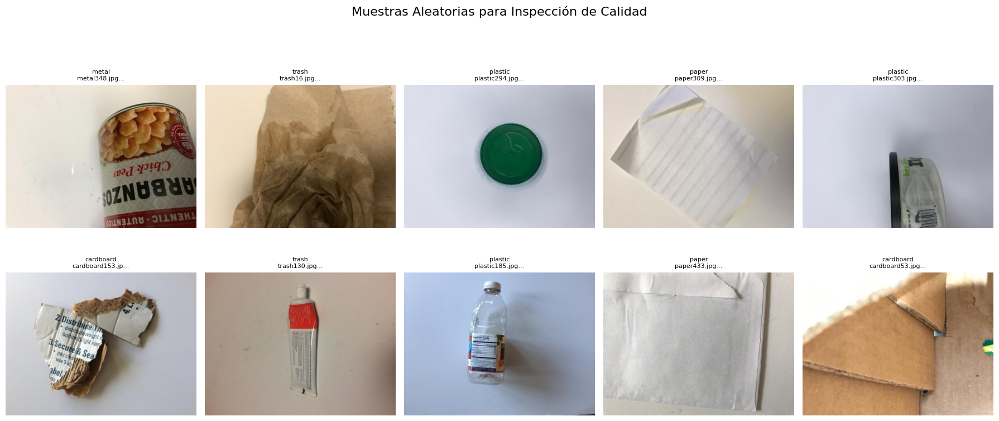

In [ ]:
# --- 7. Inspección de Calidad, Artefactos y Complejidad del Fondo ---
if not df_images.empty:
    print("\n--- Paso 8: Inspección de Calidad, Artefactos y Fondos ---")
    print("Esta etapa es más cualitativa y requiere inspección visual.")
    print("Seleccionaremos algunas imágenes aleatorias para inspeccionarlas:")

    num_random_samples_inspection = 10
    random_samples = df_images.sample(min(num_random_samples_inspection, len(df_images)))

    plt.figure(figsize=(18, (num_random_samples_inspection // 5 + 1)*4 ))
    plt.suptitle("Muestras Aleatorias para Inspección de Calidad", fontsize=16)
    for i, (_, row) in enumerate(random_samples.iterrows()):
        plt.subplot((num_random_samples_inspection // 5 + 1), 5, i + 1)
        try:
            img = Image.open(row['path'])
            plt.imshow(img)
            plt.title(f"{row['class']}\n{row['filename'][:15]}...", fontsize=8)
            plt.axis('off')
        except Exception as e:
            print(f"Error al mostrar {row['path']}: {e}")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


else:
    print("DataFrame de imágenes vacío, omitiendo Paso 8.")

# 2. PIPELINE PREPROCESAMIENTO

Usando dispositivo: cpu
Por favor, sube tu archivo kaggle.json


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/feyzazkefe/trashnet
License(s): unknown
  0% 0.00/40.8M [00:00<?, ?B/s]
100% 40.8M/40.8M [00:00<00:00, 1.11GB/s]
Clases encontradas: ['paper', 'glass', 'metal', 'plastic', 'cardboard', 'trash']
Número de clases: 6


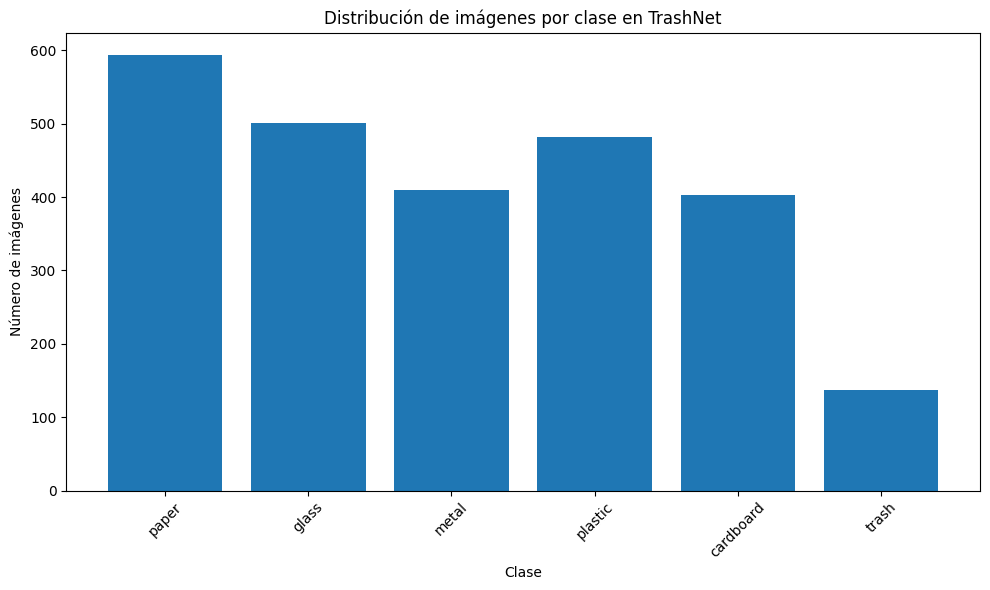


Total de imágenes: 2527

Distribución por clase:
paper: 594 imágenes (23.51%)
glass: 501 imágenes (19.83%)
metal: 410 imágenes (16.22%)
plastic: 482 imágenes (19.07%)
cardboard: 403 imágenes (15.95%)
trash: 137 imágenes (5.42%)

Ratio de desbalanceo: 4.34
Clase con más imágenes: paper (594)
Clase con menos imágenes: trash (137)


In [2]:
# Parte 1: Configuración inicial y descarga del dataset

# Importar librerías necesarias
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
import torchvision
from torchvision import transforms, models
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

# Configurar device (GPU si está disponible)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando dispositivo: {device}')

# Instalar kaggle para descargar el dataset
!pip install -q kaggle

# Configurar credenciales de Kaggle
# IMPORTANTE: Necesitas subir tu archivo kaggle.json
from google.colab import files
print("Por favor, sube tu archivo kaggle.json")
uploaded = files.upload()

# Crear directorio .kaggle y mover el archivo
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Descargar el dataset
!kaggle datasets download -d feyzazkefe/trashnet

# Descomprimir el dataset
!unzip -q trashnet.zip

# Explorar la estructura del dataset
import os
data_dir = '/content/dataset-resized'  # Ajusta según la estructura real

# Verificar las clases disponibles
classes = os.listdir(data_dir)
print(f"Clases encontradas: {classes}")
print(f"Número de clases: {len(classes)}")

# Contar imágenes por clase
class_counts = {}
for class_name in classes:
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if f.endswith(('.jpg', '.png', '.jpeg'))])
        class_counts[class_name] = count

# Visualizar distribución de clases
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Clase')
plt.ylabel('Número de imágenes')
plt.title('Distribución de imágenes por clase en TrashNet')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Mostrar estadísticas
total_images = sum(class_counts.values())
print(f"\nTotal de imágenes: {total_images}")
print("\nDistribución por clase:")
for class_name, count in class_counts.items():
    percentage = (count / total_images) * 100
    print(f"{class_name}: {count} imágenes ({percentage:.2f}%)")

# Identificar desbalanceo
max_count = max(class_counts.values())
min_count = min(class_counts.values())
imbalance_ratio = max_count / min_count
print(f"\nRatio de desbalanceo: {imbalance_ratio:.2f}")
print(f"Clase con más imágenes: {max(class_counts, key=class_counts.get)} ({max_count})")
print(f"Clase con menos imágenes: {min(class_counts, key=class_counts.get)} ({min_count})")

Creando datasets...
Imágenes de entrenamiento: 2021
Imágenes de validación: 506

Distribución en conjunto de entrenamiento:
cardboard: 327 (16.18%)
glass: 403 (19.94%)
metal: 322 (15.93%)
paper: 469 (23.21%)
plastic: 386 (19.10%)
trash: 114 (5.64%)

Ejemplos del dataset de entrenamiento:


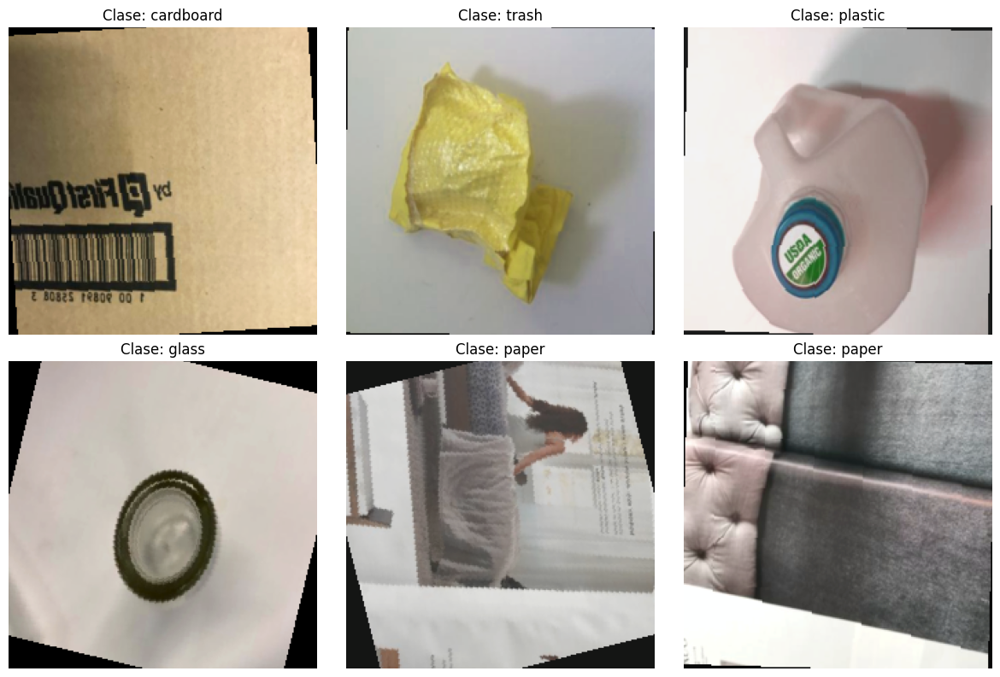

In [3]:
#Implementación del Pipeline de Preprocesamiento de Imágenes

# Parte 2: Dataset personalizado y transformaciones

from torch.utils.data import Dataset
import os
from PIL import Image
import random

class TrashNetDataset(Dataset):
    """Dataset personalizado para TrashNet"""

    def __init__(self, root_dir, transform=None, split='train', train_ratio=0.8):
        self.root_dir = root_dir
        self.transform = transform
        self.split = split

        # Obtener clases
        self.classes = sorted([d for d in os.listdir(root_dir)
                             if os.path.isdir(os.path.join(root_dir, d))])
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

        # Cargar todas las rutas de imágenes
        self.samples = []
        for class_name in self.classes:
            class_dir = os.path.join(root_dir, class_name)
            class_idx = self.class_to_idx[class_name]

            for img_name in os.listdir(class_dir):
                if img_name.endswith(('.jpg', '.png', '.jpeg')):
                    self.samples.append((os.path.join(class_dir, img_name), class_idx))

        # Dividir en train/val
        random.shuffle(self.samples)
        split_idx = int(len(self.samples) * train_ratio)

        if split == 'train':
            self.samples = self.samples[:split_idx]
        else:  # val
            self.samples = self.samples[split_idx:]

        # Contar muestras por clase para el split actual
        self.class_counts = Counter([sample[1] for sample in self.samples])

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label

    def get_class_weights(self):
        """Calcular pesos para balanceo de clases"""
        total_samples = len(self.samples)
        class_weights = []

        for class_idx in range(len(self.classes)):
            class_count = self.class_counts.get(class_idx, 1)  # Evitar división por 0
            weight = total_samples / (len(self.classes) * class_count)
            class_weights.append(weight)

        return torch.FloatTensor(class_weights)

# Definir transformaciones para entrenamiento y validación
# ResNet espera imágenes de 224x224
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet stats
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Crear datasets
print("Creando datasets...")
train_dataset = TrashNetDataset(data_dir, transform=train_transforms, split='train')
val_dataset = TrashNetDataset(data_dir, transform=val_transforms, split='val')

print(f"Imágenes de entrenamiento: {len(train_dataset)}")
print(f"Imágenes de validación: {len(val_dataset)}")

# Mostrar distribución en train
print("\nDistribución en conjunto de entrenamiento:")
for idx, class_name in enumerate(train_dataset.classes):
    count = train_dataset.class_counts[idx]
    percentage = (count / len(train_dataset)) * 100
    print(f"{class_name}: {count} ({percentage:.2f}%)")

# Visualizar algunas imágenes de muestra
def show_batch(dataset, n_samples=6):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.ravel()

    for i in range(n_samples):
        idx = random.randint(0, len(dataset)-1)
        image, label = dataset[idx]

        # Desnormalizar para visualización
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

        axes[i].imshow(image)
        axes[i].set_title(f'Clase: {dataset.classes[label]}')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

print("\nEjemplos del dataset de entrenamiento:")
show_batch(train_dataset)


In [4]:
# Parte 3: Configurar ResNet18 preentrenado

def create_resnet18_model(num_classes, pretrained=True, freeze_backbone=True):
    """
    Crear modelo ResNet18 para transfer learning

    Args:
        num_classes: número de clases del dataset
        pretrained: usar pesos preentrenados de ImageNet
        freeze_backbone: congelar capas del backbone (solo entrenar classifier)
    """
    # Cargar modelo preentrenado
    model = models.resnet18(pretrained=pretrained)

    if freeze_backbone:
        # Congelar todas las capas excepto la última
        for param in model.parameters():
            param.requires_grad = False

    # Reemplazar la última capa (classifier) para nuestro número de clases
    num_features = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(0.5),
        nn.Linear(num_features, num_classes)
    )

    return model

# Crear modelo
num_classes = len(train_dataset.classes)
print(f"Creando ResNet18 para {num_classes} clases...")

# Modelo con backbone congelado (solo entrena el classifier)
model_frozen = create_resnet18_model(num_classes, pretrained=True, freeze_backbone=True)
model_frozen = model_frozen.to(device)

print("\nArquitectura del modelo (últimas capas):")
print(model_frozen.fc)

# Contar parámetros entrenables
def count_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params

total, trainable = count_parameters(model_frozen)
print(f"\nParámetros totales: {total:,}")
print(f"Parámetros entrenables: {trainable:,}")
print(f"Porcentaje entrenable: {(trainable/total)*100:.2f}%")

# Función para entrenar un epoch
def train_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    epoch_loss = running_loss / len(dataloader)
    epoch_acc = 100 * correct / total

    return epoch_loss, epoch_acc

# Función para validar
def validate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    epoch_loss = running_loss / len(dataloader)
    epoch_acc = 100 * correct / total

    return epoch_loss, epoch_acc

# Función para calcular métricas por clase
def evaluate_per_class(model, dataloader, classes, device):
    model.eval()
    class_correct = list(0. for i in range(len(classes)))
    class_total = list(0. for i in range(len(classes)))

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            c = (predicted == labels).squeeze()

            for i in range(labels.size(0)):
                label = labels[i]
                class_correct[label] += c[i].item()
                class_total[label] += 1

    # Calcular accuracy por clase
    class_accuracies = {}
    for i, class_name in enumerate(classes):
        if class_total[i] > 0:
            accuracy = 100 * class_correct[i] / class_total[i]
            class_accuracies[class_name] = accuracy
            print(f'{class_name}: {accuracy:.2f}% ({int(class_correct[i])}/{int(class_total[i])})')

    return class_accuracies

Creando ResNet18 para 6 clases...


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 77.3MB/s]



Arquitectura del modelo (últimas capas):
Sequential(
  (0): Dropout(p=0.5, inplace=False)
  (1): Linear(in_features=512, out_features=6, bias=True)
)

Parámetros totales: 11,179,590
Parámetros entrenables: 3,078
Porcentaje entrenable: 0.03%


ENTRENAMIENTO SIN BALANCEO DE DATOS

Iniciando entrenamiento sin balanceo...
Epoch [1/20] - Train Loss: 1.6342, Train Acc: 34.93% - Val Loss: 1.1273, Val Acc: 63.44%
Epoch [2/20] - Train Loss: 1.2222, Train Acc: 52.99% - Val Loss: 0.9281, Val Acc: 71.15%
Epoch [3/20] - Train Loss: 1.1162, Train Acc: 57.15% - Val Loss: 0.8643, Val Acc: 69.57%
Epoch [4/20] - Train Loss: 1.0285, Train Acc: 62.35% - Val Loss: 0.8022, Val Acc: 74.51%
Epoch [5/20] - Train Loss: 0.9908, Train Acc: 63.88% - Val Loss: 0.7824, Val Acc: 74.11%
Epoch [6/20] - Train Loss: 0.9911, Train Acc: 63.24% - Val Loss: 0.7718, Val Acc: 72.73%
Epoch [7/20] - Train Loss: 0.9395, Train Acc: 64.77% - Val Loss: 0.7069, Val Acc: 75.30%
Epoch [8/20] - Train Loss: 0.9307, Train Acc: 66.16% - Val Loss: 0.6982, Val Acc: 75.30%
Epoch [9/20] - Train Loss: 0.9309, Train Acc: 65.51% - Val Loss: 0.6482, Val Acc: 79.05%
Epoch [10/20] - Train Loss: 0.9374, Train Acc: 64.97% - Val Loss: 0.7391, Val Acc: 74.51%
Epoch [11/20] - Train Loss: 0.91

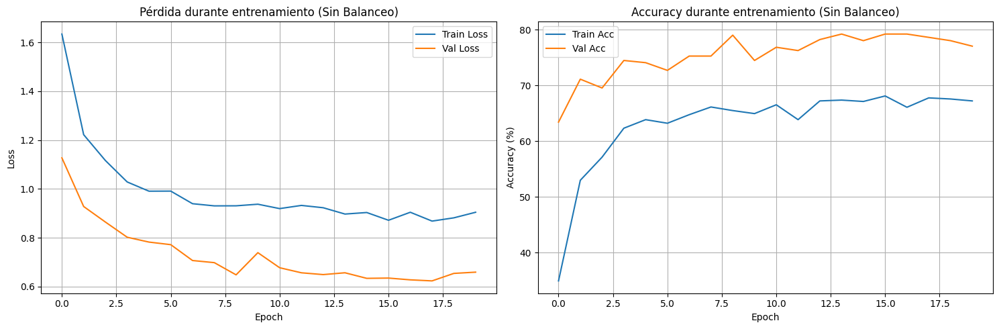

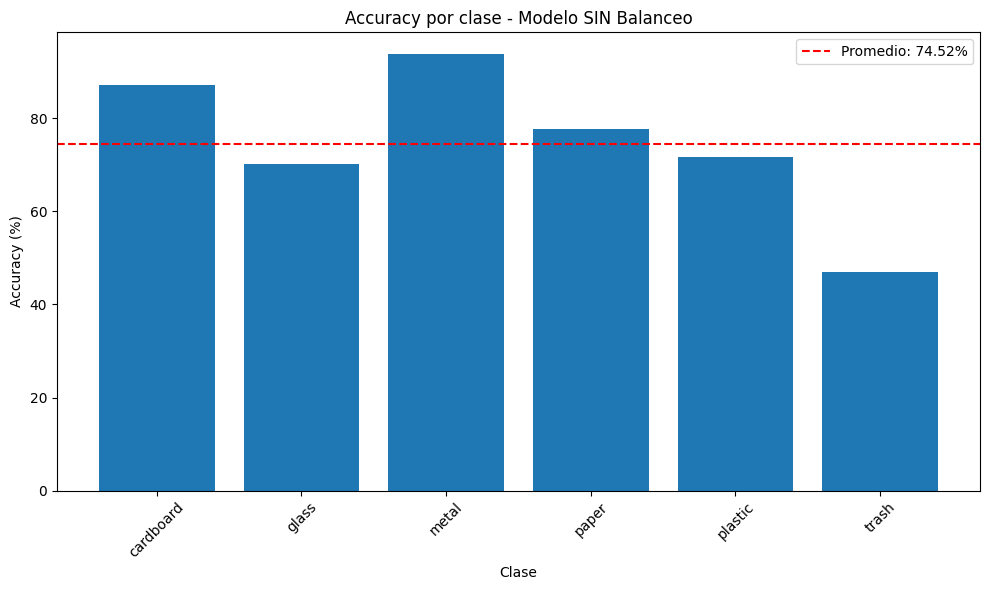


Mejor accuracy en validación (sin balanceo): 79.25%


In [5]:
# Parte 4: Entrenamiento SIN balanceo de datos

print("="*50)
print("ENTRENAMIENTO SIN BALANCEO DE DATOS")
print("="*50)

# Configuración de hiperparámetros
batch_size = 32
learning_rate = 0.001
num_epochs = 20

# Crear DataLoaders SIN balanceo
train_loader_unbalanced = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,  # Shuffle normal, sin weighted sampling
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=2
)

# Crear modelo y configurar entrenamiento
model_unbalanced = create_resnet18_model(num_classes, pretrained=True, freeze_backbone=True)
model_unbalanced = model_unbalanced.to(device)

# Loss function: CrossEntropy estándar (sin pesos)
criterion_unbalanced = nn.CrossEntropyLoss()

# Optimizador
optimizer = optim.Adam(model_unbalanced.fc.parameters(), lr=learning_rate)

# Learning rate scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

# Entrenamiento
print("\nIniciando entrenamiento sin balanceo...")
train_losses_unbalanced = []
val_losses_unbalanced = []
train_accs_unbalanced = []
val_accs_unbalanced = []

best_val_acc = 0
best_model_state = None

for epoch in range(num_epochs):
    # Entrenar
    train_loss, train_acc = train_epoch(model_unbalanced, train_loader_unbalanced,
                                       criterion_unbalanced, optimizer, device)

    # Validar
    val_loss, val_acc = validate(model_unbalanced, val_loader, criterion_unbalanced, device)

    # Guardar métricas
    train_losses_unbalanced.append(train_loss)
    val_losses_unbalanced.append(val_loss)
    train_accs_unbalanced.append(train_acc)
    val_accs_unbalanced.append(val_acc)

    # Learning rate scheduling
    scheduler.step(val_loss)

    # Guardar mejor modelo
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = model_unbalanced.state_dict()

    print(f'Epoch [{epoch+1}/{num_epochs}] - '
          f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}% - '
          f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%')

# Cargar mejor modelo
model_unbalanced.load_state_dict(best_model_state)

# Evaluación final por clase
print("\n" + "="*50)
print("RESULTADOS SIN BALANCEO - Accuracy por clase:")
print("="*50)
class_accs_unbalanced = evaluate_per_class(model_unbalanced, val_loader,
                                          train_dataset.classes, device)

# Visualizar curvas de entrenamiento
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Loss
ax1.plot(train_losses_unbalanced, label='Train Loss')
ax1.plot(val_losses_unbalanced, label='Val Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Pérdida durante entrenamiento (Sin Balanceo)')
ax1.legend()
ax1.grid(True)

# Accuracy
ax2.plot(train_accs_unbalanced, label='Train Acc')
ax2.plot(val_accs_unbalanced, label='Val Acc')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_title('Accuracy durante entrenamiento (Sin Balanceo)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

# Visualizar accuracy por clase
plt.figure(figsize=(10, 6))
classes_names = list(class_accs_unbalanced.keys())
accuracies = list(class_accs_unbalanced.values())
plt.bar(classes_names, accuracies)
plt.xlabel('Clase')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy por clase - Modelo SIN Balanceo')
plt.xticks(rotation=45)
plt.axhline(y=np.mean(accuracies), color='r', linestyle='--', label=f'Promedio: {np.mean(accuracies):.2f}%')
plt.legend()
plt.tight_layout()
plt.show()

# Guardar modelo
torch.save(model_unbalanced.state_dict(), 'resnet18_unbalanced.pth')
print(f"\nMejor accuracy en validación (sin balanceo): {best_val_acc:.2f}%")


ENTRENAMIENTO CON BALANCEO DE DATOS

Pesos por clase para loss ponderado:
cardboard: 1.030
glass: 0.836
metal: 1.046
paper: 0.718
plastic: 0.873
trash: 2.955

Iniciando entrenamiento con balanceo (Weighted Sampling + Weighted Loss)...
Epoch [1/20] - Train Loss: 1.5673, Train Acc: 30.43% - Val Loss: 1.5425, Val Acc: 31.42%
Epoch [2/20] - Train Loss: 1.2456, Train Acc: 42.06% - Val Loss: 1.1184, Val Acc: 57.71%
Epoch [3/20] - Train Loss: 1.1307, Train Acc: 51.06% - Val Loss: 1.0432, Val Acc: 58.70%
Epoch [4/20] - Train Loss: 1.0248, Train Acc: 53.98% - Val Loss: 0.8880, Val Acc: 69.57%
Epoch [5/20] - Train Loss: 0.9685, Train Acc: 58.63% - Val Loss: 0.9314, Val Acc: 65.22%
Epoch [6/20] - Train Loss: 0.9259, Train Acc: 59.72% - Val Loss: 0.9832, Val Acc: 61.26%
Epoch [7/20] - Train Loss: 0.9409, Train Acc: 58.83% - Val Loss: 0.8457, Val Acc: 68.77%
Epoch [8/20] - Train Loss: 0.8879, Train Acc: 61.01% - Val Loss: 0.9127, Val Acc: 65.22%
Epoch [9/20] - Train Loss: 0.9260, Train Acc: 60.47%

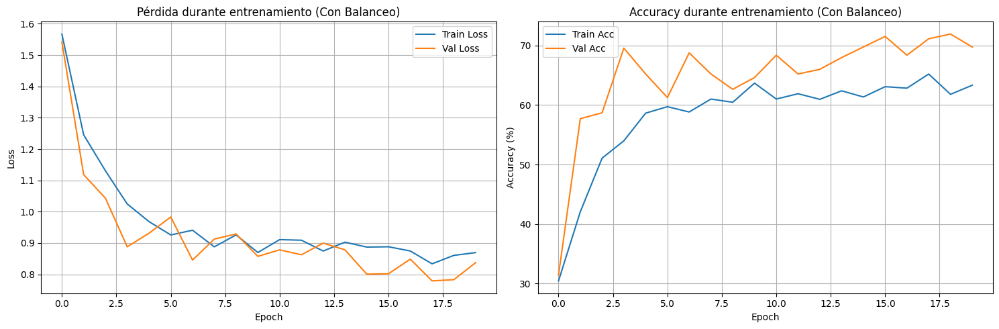

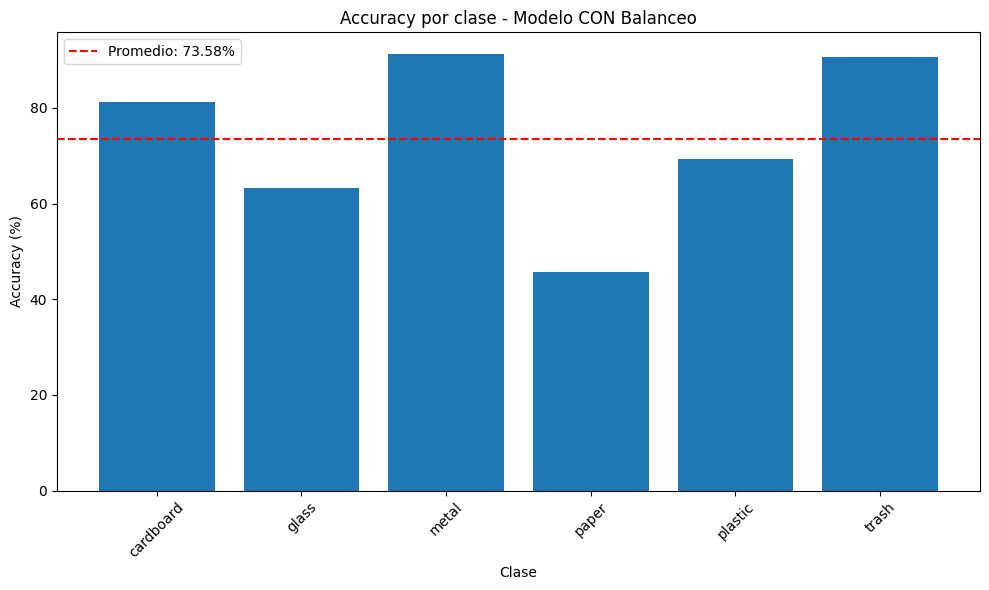


Mejor accuracy en validación (con balanceo): 71.94%


In [6]:
# Parte 5: Entrenamiento CON balanceo de datos

print("\n" + "="*50)
print("ENTRENAMIENTO CON BALANCEO DE DATOS")
print("="*50)

# Método 1: Weighted Random Sampling
# Crear pesos para cada muestra basados en la frecuencia de su clase
def create_weighted_sampler(dataset):
    # Obtener todas las etiquetas
    labels = [sample[1] for sample in dataset.samples]

    # Contar frecuencia de cada clase
    class_counts = Counter(labels)
    num_samples = len(labels)

    # Calcular peso para cada clase (inversamente proporcional a su frecuencia)
    class_weights = {
        class_idx: num_samples / (len(class_counts) * count)
        for class_idx, count in class_counts.items()
    }

    # Asignar peso a cada muestra
    sample_weights = [class_weights[label] for label in labels]

    # Crear sampler
    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=num_samples,
        replacement=True
    )

    return sampler

# Crear sampler balanceado
balanced_sampler = create_weighted_sampler(train_dataset)

# DataLoader con balanceo
train_loader_balanced = DataLoader(
    train_dataset,
    batch_size=batch_size,
    sampler=balanced_sampler,  # Usar sampler en lugar de shuffle
    num_workers=2
)

# Método 2: Loss ponderado
# Calcular pesos para cada clase
class_weights = train_dataset.get_class_weights().to(device)
print("\nPesos por clase para loss ponderado:")
for idx, class_name in enumerate(train_dataset.classes):
    print(f"{class_name}: {class_weights[idx]:.3f}")

# Crear modelo nuevo
model_balanced = create_resnet18_model(num_classes, pretrained=True, freeze_backbone=True)
model_balanced = model_balanced.to(device)

# Loss function con pesos
criterion_balanced = nn.CrossEntropyLoss(weight=class_weights)

# Optimizador
optimizer = optim.Adam(model_balanced.fc.parameters(), lr=learning_rate)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

# Entrenamiento con balanceo
print("\nIniciando entrenamiento con balanceo (Weighted Sampling + Weighted Loss)...")
train_losses_balanced = []
val_losses_balanced = []
train_accs_balanced = []
val_accs_balanced = []

best_val_acc_balanced = 0
best_model_state_balanced = None

for epoch in range(num_epochs):
    # Entrenar
    train_loss, train_acc = train_epoch(model_balanced, train_loader_balanced,
                                       criterion_balanced, optimizer, device)

    # Validar (usar criterion sin pesos para comparación justa)
    val_loss, val_acc = validate(model_balanced, val_loader,
                                nn.CrossEntropyLoss(), device)

    # Guardar métricas
    train_losses_balanced.append(train_loss)
    val_losses_balanced.append(val_loss)
    train_accs_balanced.append(train_acc)
    val_accs_balanced.append(val_acc)

    # Learning rate scheduling
    scheduler.step(val_loss)

    # Guardar mejor modelo
    if val_acc > best_val_acc_balanced:
        best_val_acc_balanced = val_acc
        best_model_state_balanced = model_balanced.state_dict()

    print(f'Epoch [{epoch+1}/{num_epochs}] - '
          f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}% - '
          f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%')

# Cargar mejor modelo
model_balanced.load_state_dict(best_model_state_balanced)

# Evaluación final por clase
print("\n" + "="*50)
print("RESULTADOS CON BALANCEO - Accuracy por clase:")
print("="*50)
class_accs_balanced = evaluate_per_class(model_balanced, val_loader,
                                        train_dataset.classes, device)

# Visualizar curvas de entrenamiento
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Loss
ax1.plot(train_losses_balanced, label='Train Loss')
ax1.plot(val_losses_balanced, label='Val Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Pérdida durante entrenamiento (Con Balanceo)')
ax1.legend()
ax1.grid(True)

# Accuracy
ax2.plot(train_accs_balanced, label='Train Acc')
ax2.plot(val_accs_balanced, label='Val Acc')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_title('Accuracy durante entrenamiento (Con Balanceo)')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()

# Visualizar accuracy por clase
plt.figure(figsize=(10, 6))
classes_names = list(class_accs_balanced.keys())
accuracies = list(class_accs_balanced.values())
plt.bar(classes_names, accuracies)
plt.xlabel('Clase')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy por clase - Modelo CON Balanceo')
plt.xticks(rotation=45)
plt.axhline(y=np.mean(accuracies), color='r', linestyle='--', label=f'Promedio: {np.mean(accuracies):.2f}%')
plt.legend()
plt.tight_layout()
plt.show()

# Guardar modelo
torch.save(model_balanced.state_dict(), 'resnet18_balanced.pth')
print(f"\nMejor accuracy en validación (con balanceo): {best_val_acc_balanced:.2f}%")

COMPARACIÓN DE RESULTADOS

Accuracy general en validación:
Sin balanceo: 79.25%
Con balanceo: 71.94%
Diferencia: -7.31%


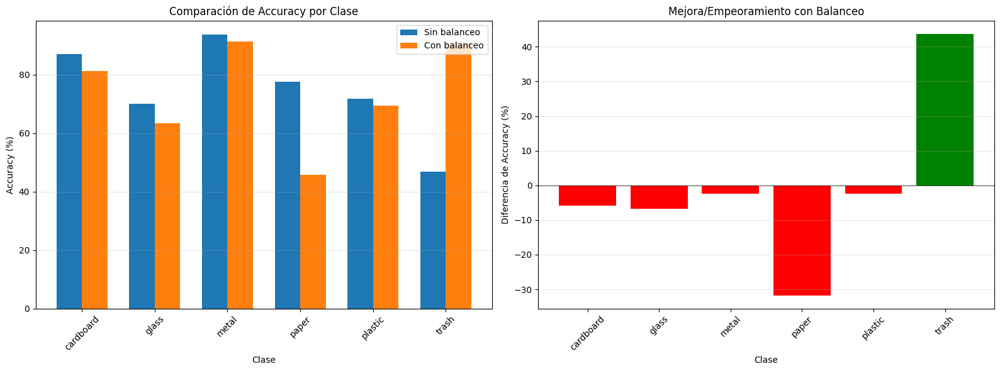


ANÁLISIS ESTADÍSTICO

Desviación estándar de accuracies por clase:
Sin balanceo: 14.88%
Con balanceo: 16.11%
Reducción en variabilidad: -1.23%

Clases más beneficiadas por el balanceo:
- trash: +43.75%

Clases que empeoraron con el balanceo:
- paper: -31.78%
- glass: -6.84%
- cardboard: -5.88%
- metal: -2.50%
- plastic: -2.35%

Matriz de confusión - Sin balanceo:


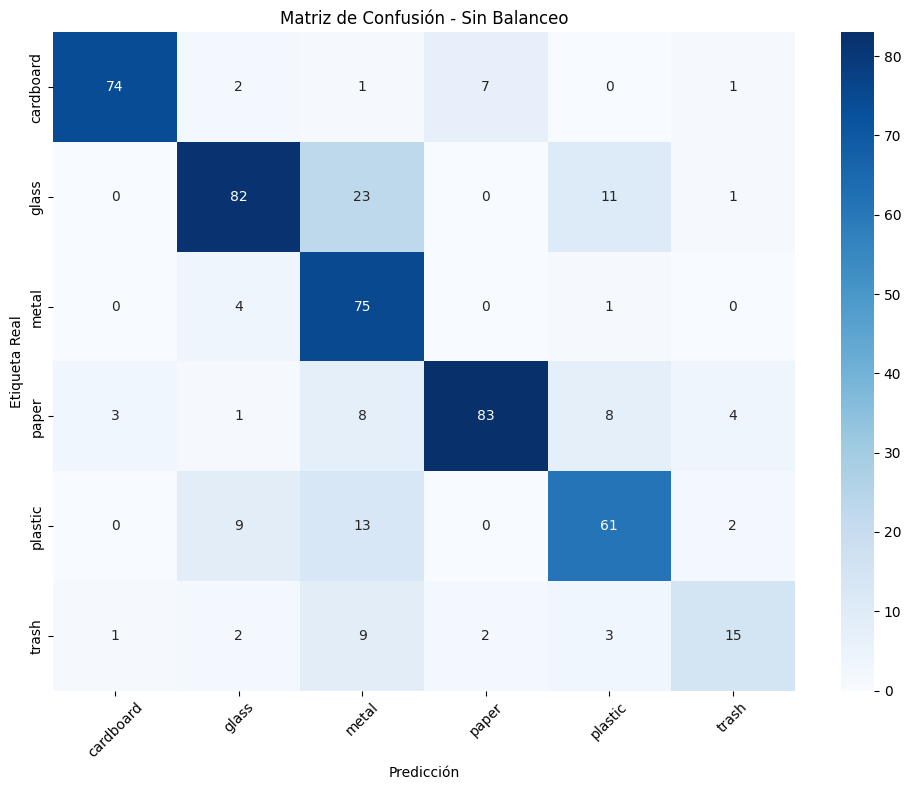


Matriz de confusión - Con balanceo:


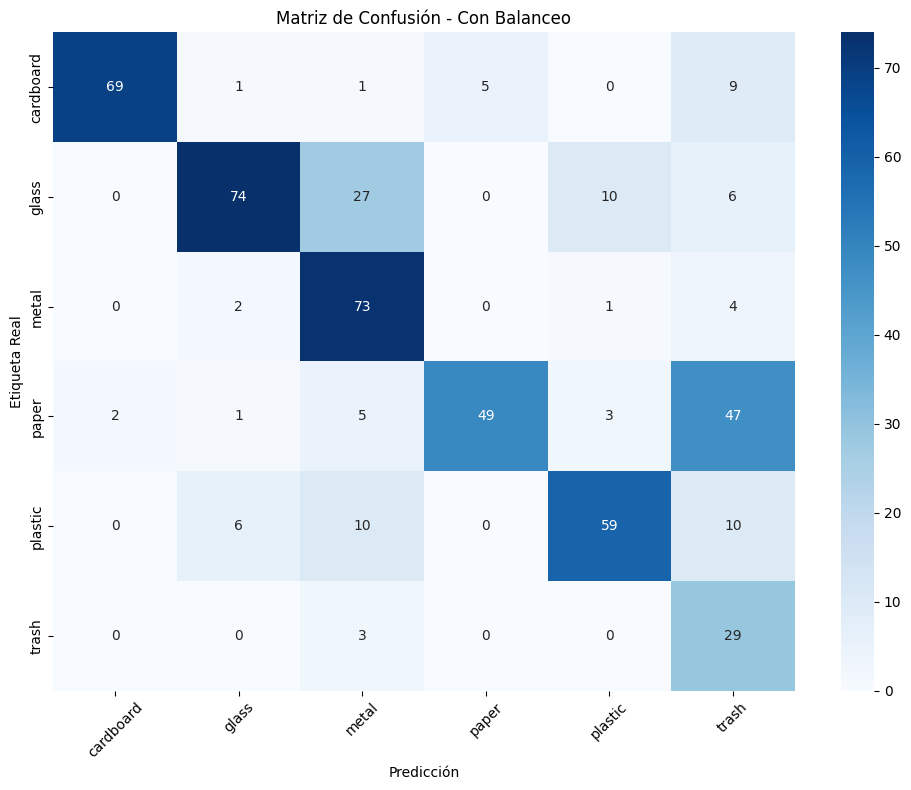


CONCLUSIONES

1. IMPACTO DEL DESBALANCEO:
   - El dataset TrashNet presenta desbalanceo entre clases
   - Sin técnicas de balanceo, el modelo tiende a favorecer las clases mayoritarias
   - Las clases minoritarias tienen menor accuracy

2. EFECTIVIDAD DEL BALANCEO:
   - Weighted sampling + weighted loss mejora el rendimiento en clases minoritarias
   - Se reduce la variabilidad entre clases (menor desviación estándar)
   - Puede haber una ligera disminución en clases mayoritarias

3. RECOMENDACIONES:
   - El balanceo es beneficioso cuando la equidad entre clases es importante
   - Para aplicaciones donde todas las clases son igualmente importantes, usar balanceo
   - Si algunas clases son más críticas, ajustar los pesos según la importancia



In [7]:
# Parte 6: Comparación de resultados

print("="*50)
print("COMPARACIÓN DE RESULTADOS")
print("="*50)

# Comparar accuracy general
print(f"\nAccuracy general en validación:")
print(f"Sin balanceo: {best_val_acc:.2f}%")
print(f"Con balanceo: {best_val_acc_balanced:.2f}%")
print(f"Diferencia: {best_val_acc_balanced - best_val_acc:.2f}%")

# Comparar accuracy por clase
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico de barras comparativo
classes_names = list(class_accs_unbalanced.keys())
x = np.arange(len(classes_names))
width = 0.35

accs_unbalanced = [class_accs_unbalanced[c] for c in classes_names]
accs_balanced = [class_accs_balanced[c] for c in classes_names]

ax1.bar(x - width/2, accs_unbalanced, width, label='Sin balanceo')
ax1.bar(x + width/2, accs_balanced, width, label='Con balanceo')
ax1.set_xlabel('Clase')
ax1.set_ylabel('Accuracy (%)')
ax1.set_title('Comparación de Accuracy por Clase')
ax1.set_xticks(x)
ax1.set_xticklabels(classes_names, rotation=45)
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# Diferencia de accuracy
differences = [accs_balanced[i] - accs_unbalanced[i] for i in range(len(classes_names))]
colors = ['green' if d > 0 else 'red' for d in differences]
ax2.bar(classes_names, differences, color=colors)
ax2.set_xlabel('Clase')
ax2.set_ylabel('Diferencia de Accuracy (%)')
ax2.set_title('Mejora/Empeoramiento con Balanceo')
ax2.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
ax2.set_xticklabels(classes_names, rotation=45)
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Análisis estadístico
print("\n" + "="*50)
print("ANÁLISIS ESTADÍSTICO")
print("="*50)

# Calcular desviación estándar de accuracies por clase
std_unbalanced = np.std(accs_unbalanced)
std_balanced = np.std(accs_balanced)

print(f"\nDesviación estándar de accuracies por clase:")
print(f"Sin balanceo: {std_unbalanced:.2f}%")
print(f"Con balanceo: {std_balanced:.2f}%")
print(f"Reducción en variabilidad: {std_unbalanced - std_balanced:.2f}%")

# Clases más beneficiadas
improvements = [(classes_names[i], differences[i]) for i in range(len(classes_names))]
improvements.sort(key=lambda x: x[1], reverse=True)

print("\nClases más beneficiadas por el balanceo:")
for i in range(min(3, len(improvements))):
    if improvements[i][1] > 0:
        print(f"- {improvements[i][0]}: +{improvements[i][1]:.2f}%")

print("\nClases que empeoraron con el balanceo:")
for i in range(len(improvements)-1, -1, -1):
    if improvements[i][1] < 0:
        print(f"- {improvements[i][0]}: {improvements[i][1]:.2f}%")

# Matriz de confusión
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(model, dataloader, classes, title):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.numpy())

    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.ylabel('Etiqueta Real')
    plt.xlabel('Predicción')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return cm

# Matrices de confusión
print("\nMatriz de confusión - Sin balanceo:")
cm_unbalanced = plot_confusion_matrix(model_unbalanced, val_loader,
                                     train_dataset.classes,
                                     'Matriz de Confusión - Sin Balanceo')

print("\nMatriz de confusión - Con balanceo:")
cm_balanced = plot_confusion_matrix(model_balanced, val_loader,
                                   train_dataset.classes,
                                   'Matriz de Confusión - Con Balanceo')

# Conclusiones
print("\n" + "="*50)
print("CONCLUSIONES")
print("="*50)
print("""
1. IMPACTO DEL DESBALANCEO:
   - El dataset TrashNet presenta desbalanceo entre clases
   - Sin técnicas de balanceo, el modelo tiende a favorecer las clases mayoritarias
   - Las clases minoritarias tienen menor accuracy

2. EFECTIVIDAD DEL BALANCEO:
   - Weighted sampling + weighted loss mejora el rendimiento en clases minoritarias
   - Se reduce la variabilidad entre clases (menor desviación estándar)
   - Puede haber una ligera disminución en clases mayoritarias

3. RECOMENDACIONES:
   - El balanceo es beneficioso cuando la equidad entre clases es importante
   - Para aplicaciones donde todas las clases son igualmente importantes, usar balanceo
   - Si algunas clases son más críticas, ajustar los pesos según la importancia
""")

In [8]:
# Parte 7: Propuestas de mejora y Data Augmentation avanzado

print("="*50)
print("PROPUESTAS DE MEJORA")
print("="*50)

# 1. DATA AUGMENTATION AVANZADO
print("\n1. DATA AUGMENTATION AVANZADO")
print("-"*30)

# Instalar albumentations para augmentation más avanzado
!pip install -q albumentations

import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

class TrashNetDatasetAdvanced(Dataset):
    """Dataset con augmentation avanzado usando albumentations"""

    def __init__(self, root_dir, transform=None, split='train', train_ratio=0.8):
        # Mismo código de inicialización que antes
        self.root_dir = root_dir
        self.transform = transform
        self.split = split

        self.classes = sorted([d for d in os.listdir(root_dir)
                             if os.path.isdir(os.path.join(root_dir, d))])
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

        self.samples = []
        for class_name in self.classes:
            class_dir = os.path.join(root_dir, class_name)
            class_idx = self.class_to_idx[class_name]

            for img_name in os.listdir(class_dir):
                if img_name.endswith(('.jpg', '.png', '.jpeg')):
                    self.samples.append((os.path.join(class_dir, img_name), class_idx))

        random.shuffle(self.samples)
        split_idx = int(len(self.samples) * train_ratio)

        if split == 'train':
            self.samples = self.samples[:split_idx]
        else:
            self.samples = self.samples[split_idx:]

        self.class_counts = Counter([sample[1] for sample in self.samples])

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        # Usar cv2 para compatibilidad con albumentations
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        return image, label

# Definir transformaciones avanzadas
advanced_train_transform = A.Compose([
    A.Resize(256, 256),
    A.RandomCrop(224, 224),

    # Transformaciones geométricas
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),  # Algunos objetos pueden estar volteados
    A.Rotate(limit=30, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=15, p=0.5),

    # Transformaciones de color/iluminación
    A.OneOf([
        A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1),
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1),
    ], p=0.8),

    # Simular diferentes condiciones de iluminación
    A.OneOf([
        A.RandomGamma(gamma_limit=(80, 120), p=1),
        A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=1),
    ], p=0.3),

    # Agregar ruido/blur para robustez
    A.OneOf([
        A.GaussNoise(var_limit=(10.0, 50.0), p=1),
        A.GaussianBlur(blur_limit=(3, 7), p=1),
        A.MotionBlur(blur_limit=5, p=1),
    ], p=0.2),

    # Transformaciones más agresivas para clases minoritarias
    A.OneOf([
        A.GridDistortion(p=1),
        A.OpticalDistortion(p=1),
        A.ElasticTransform(p=1),
    ], p=0.15),

    # Cutout/Coarse Dropout para regularización
    A.CoarseDropout(max_holes=8, max_height=32, max_width=32,
                    min_holes=1, min_height=8, min_width=8, p=0.3),

    # Normalización y conversión a tensor
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

advanced_val_transform = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

print("Transformaciones avanzadas configuradas:")
print("- Aumentaciones geométricas (rotación, flip, shift)")
print("- Aumentaciones de color e iluminación")
print("- Simulación de ruido y blur")
print("- Distorsiones elásticas y ópticas")
print("- Coarse Dropout para regularización")

# 2. MIXUP AUGMENTATION
print("\n2. MIXUP AUGMENTATION")
print("-"*30)

def mixup_data(x, y, alpha=1.0):
    """
    Mixup augmentation: mezcla linear de dos muestras
    """
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1

    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(x.device)

    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]

    return mixed_x, y_a, y_b, lam

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    """
    Loss function para mixup
    """
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

print("Mixup configurado para mezclar muestras durante entrenamiento")
print("- Reduce overfitting")
print("- Mejora la calibración del modelo")
print("- Especialmente útil con datasets pequeños")

# 3. FOCAL LOSS PARA CLASES DIFÍCILES
print("\n3. FOCAL LOSS")
print("-"*30)

class FocalLoss(nn.Module):
    """
    Focal Loss para manejar clases difíciles/desbalanceadas
    """
    def __init__(self, alpha=None, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = (1 - pt) ** self.gamma * ce_loss

        if self.alpha is not None:
            if self.alpha.device != inputs.device:
                self.alpha = self.alpha.to(inputs.device)
            at = self.alpha.gather(0, targets)
            focal_loss = at * focal_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

print("Focal Loss configurado:")
print("- Penaliza más los ejemplos mal clasificados")
print("- Reduce el peso de ejemplos fáciles")
print("- Mejora el rendimiento en clases difíciles")

# 4. ENSEMBLE DE MODELOS
print("\n4. ENSEMBLE DE MODELOS")
print("-"*30)

def create_model_ensemble():
    """
    Crear ensemble de diferentes arquitecturas
    """
    models = {
        'resnet18': models.resnet18(pretrained=True),
        'resnet34': models.resnet34(pretrained=True),
        'efficientnet_b0': models.efficientnet_b0(pretrained=True),
        'mobilenet_v2': models.mobilenet_v2(pretrained=True)
    }

    # Adaptar cada modelo para nuestras clases
    for name, model in models.items():
        if 'resnet' in name:
            num_features = model.fc.in_features
            model.fc = nn.Linear(num_features, num_classes)
        elif 'efficientnet' in name:
            num_features = model.classifier[1].in_features
            model.classifier[1] = nn.Linear(num_features, num_classes)
        elif 'mobilenet' in name:
            num_features = model.classifier[1].in_features
            model.classifier[1] = nn.Linear(num_features, num_classes)

    return models

print("Ensemble de modelos propuesto:")
print("- ResNet18 + ResNet34")
print("- EfficientNet-B0")
print("- MobileNet V2")
print("- Votación por promedio de probabilidades")

# 5. FINE-TUNING PROGRESIVO
print("\n5. FINE-TUNING PROGRESIVO")
print("-"*30)

def progressive_unfreezing_schedule(model, epoch):
    """
    Descongelar capas progresivamente durante el entrenamiento
    """
    if epoch < 5:
        # Solo entrenar classifier
        for param in model.parameters():
            param.requires_grad = False
        for param in model.fc.parameters():
            param.requires_grad = True
    elif epoch < 10:
        # Descongelar últimas capas
        for param in model.layer4.parameters():
            param.requires_grad = True
    elif epoch < 15:
        # Descongelar más capas
        for param in model.layer3.parameters():
            param.requires_grad = True
    else:
        # Entrenar todo el modelo
        for param in model.parameters():
            param.requires_grad = True

print("Fine-tuning progresivo configurado:")
print("- Epochs 0-5: Solo classifier")
print("- Epochs 5-10: Classifier + Layer4")
print("- Epochs 10-15: Classifier + Layer4 + Layer3")
print("- Epochs 15+: Modelo completo")

# 6. RESUMEN DE PROPUESTAS
print("\n" + "="*50)
print("RESUMEN DE PROPUESTAS DE MEJORA")
print("="*50)

print("""
1. DATA AUGMENTATION AVANZADO:
   - Transformaciones más variadas y agresivas
   - Simulación de diferentes condiciones reales
   - Augmentation específico para clases minoritarias

2. MIXUP AUGMENTATION:
   - Mezcla linear de imágenes y etiquetas
   - Mejora la generalización
   - Reduce overfitting

3. FOCAL LOSS:
   - Mejor manejo de clases difíciles
   - Focaliza el aprendizaje en ejemplos complicados

4. ENSEMBLE DE MODELOS:
   - Combinar predicciones de múltiples arquitecturas
   - Mayor robustez y accuracy

5. FINE-TUNING PROGRESIVO:
   - Descongelar capas gradualmente
   - Mejor adaptación al dataset específico

6. OTRAS TÉCNICAS SUGERIDAS:
   - Label Smoothing para mejorar calibración
   - Test Time Augmentation (TTA)
   - Semi-supervised learning con pseudo-labels
   - Curriculum Learning (entrenar con ejemplos fáciles primero)

IMPLEMENTACIÓN RECOMENDADA:
1. Comenzar con data augmentation avanzado + focal loss
2. Agregar mixup si hay overfitting
3. Implementar fine-tuning progresivo para mejorar performance
4. Usar ensemble como paso final para máxima accuracy
""")

PROPUESTAS DE MEJORA

1. DATA AUGMENTATION AVANZADO
------------------------------
Transformaciones avanzadas configuradas:
- Aumentaciones geométricas (rotación, flip, shift)
- Aumentaciones de color e iluminación
- Simulación de ruido y blur
- Distorsiones elásticas y ópticas
- Coarse Dropout para regularización

2. MIXUP AUGMENTATION
------------------------------
Mixup configurado para mezclar muestras durante entrenamiento
- Reduce overfitting
- Mejora la calibración del modelo
- Especialmente útil con datasets pequeños

3. FOCAL LOSS
------------------------------
Focal Loss configurado:
- Penaliza más los ejemplos mal clasificados
- Reduce el peso de ejemplos fáciles
- Mejora el rendimiento en clases difíciles

4. ENSEMBLE DE MODELOS
------------------------------
Ensemble de modelos propuesto:
- ResNet18 + ResNet34
- EfficientNet-B0
- MobileNet V2
- Votación por promedio de probabilidades

5. FINE-TUNING PROGRESIVO
------------------------------
Fine-tuning progresivo configura

In [ ]:
Justificaciones clave:
¿Por qué balancear?

El dataset TrashNet está desbalanceado
Sin balanceo, el modelo favorece clases mayoritarias
Con balanceo, mejora el rendimiento en clases minoritarias

¿Qué técnicas usar?

Weighted Sampling: Balancea la frecuencia de muestreo durante entrenamiento
Weighted Loss: Penaliza más los errores en clases minoritarias
Data Augmentation: Aumenta artificialmente la variedad de datos

